# JFK Airport Project

For our project we chose to analyze and obtain information in regards to JFK airport. This presentation will be based on our webscrapping, numpy and pandas library usage, data merging and loading, and data visualization of JFK flights and airport information. I guarantee you may notice the significance of each research and result that JFK airport may or may not be the best choice of airport.

# Project Part1 : Web scraping 

In [1]:
import sys
print(sys.version)

3.8.3 (default, Jul  2 2020, 17:30:36) [MSC v.1916 64 bit (AMD64)]


In [2]:
!!pip install bs4
!!pip install request
!!pip install time
!!pip install pandas
# System used to install beautiful soup library to manage software packages with dependencies.
# Install and request packages with dependencies.
# Install time with software dependencies.
# System used to install pandas library to manage software package with dependencies.

['Requirement already satisfied: pandas in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (1.0.5)',
 'Requirement already satisfied: pytz>=2017.2 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from pandas) (2020.1)',
 'Requirement already satisfied: python-dateutil>=2.6.1 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from pandas) (2.8.1)',
 'Requirement already satisfied: numpy>=1.13.3 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from pandas) (1.18.5)',
 'Requirement already satisfied: six>=1.5 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from python-dateutil>=2.6.1->pandas) (1.15.0)']

In [3]:
import requests
from bs4 import BeautifulSoup
import time
import pandas as pd
# Request to process beautiful soup.
# Process time.
# Process pandas library.

In [4]:
airport = "JFK"
headers={'User-Agent': 'Mozilla/5.0'}

In [5]:
# get reviews for JFK.
url = 'https://www.airlinequality.com/airport-reviews/new-york-jfk-airport/?sortby=post_date%3ADesc&pagesize=100'
response = requests.get(url, headers=headers)
soup = BeautifulSoup(response.text, "html.parser")
text = soup.findAll('article')
reviews = text[0].findAll('article')
print('Searching through', len(reviews), "reviews.")
for n in range(len(reviews)):
    review = reviews[n]
    print('\nReview number:', n + 1)
    print('Written by', review.find('span',{'itemprop': 'name'}).text, "on",
          review.find('time',{'itemprop': 'datePublished'}).text)
    print(review.find('div',{'class': 'text_content'}).text)
# Use the for loop to iterate and return the sequence number of reviews. Print the reviews in text that are found in the website by specific identification.
# Could later plot out the relationship between negative reviews and number of cancellations or delays.

Searching through 100 reviews.

Review number: 1
Written by T Owen on 5th September 2020
✅ Trip Verified | Worst TSA! Negligent, rude, inefficient, dismissive. The manager of TSA (bearded and in his 50’s) was combative and immature to a point of disbelief. The lack of professionalism should not be excused.

Review number: 2
Written by H Ford on 10th June 2020
Not Verified |  The worst airport ever. All NYC airport staff generally rank low in terms of attitude and manners. It isn’t uncommon to be greeted with a very confrontational service. On this occasion I had booked NYC as a family holiday and left by the end of the week feeling so upset. A woman and man working at security shouted at my and my family completely unnecessarily. They demanded we fold down our pram with my sleeping 1 year old baby in it and then shouted at us to get her out and the to move on immediately whilst other members of staff watched with complete indifference and smiled. It was a horrible horrible experience. 

In [6]:
response.text
# Return the content of response from the URL source.

'<!doctype html>\n\n<!--[if lt IE 7]> <html class="no-js lt-ie9 lt-ie8 lt-ie7 lt-ie10" lang="en-GB"> <![endif]-->\n<!--[if IE 7]>    <html class="no-js lt-ie9 lt-ie8 lt-ie10" lang="en-GB"> <![endif]-->\n<!--[if IE 8]>    <html class="no-js lt-ie9 lt-ie10" lang="en-GB"> <![endif]-->\n<!--[if IE 9]>    <html class="no-js lt-ie10" lang="en-GB"> <![endif]-->\n<!--[if gt IE 8]><!--> <html lang="en-GB"> <!--<![endif]-->\n\t<head>\n\t\t<meta charset="utf-8">\n\n\t\t<title>New York JFK Airport Customer Reviews | SKYTRAX</title>\n\n\t\t<!-- Google Chrome Frame for IE -->\n\t\t<meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">\n\n\t\t<!-- mobile meta -->\n\t\t<meta name="HandheldFriendly" content="True">\n\t\t<meta name="MobileOptimized" content="320">\n\t\t<meta name="viewport" content="width=device-width, initial-scale=1.0, minimum-scale=1.0, maximum-scale=1.0, user-scalable=no"/>\n\t\t<!-- icons & favicons -->\n\t\t<link rel="apple-touch-icon" href="https://www.airlinequality.com/

In [7]:
soup
# Use soup library for an easier way to webscrape information.

<!DOCTYPE html>

<!--[if lt IE 7]> <html class="no-js lt-ie9 lt-ie8 lt-ie7 lt-ie10" lang="en-GB"> <![endif]-->
<!--[if IE 7]>    <html class="no-js lt-ie9 lt-ie8 lt-ie10" lang="en-GB"> <![endif]-->
<!--[if IE 8]>    <html class="no-js lt-ie9 lt-ie10" lang="en-GB"> <![endif]-->
<!--[if IE 9]>    <html class="no-js lt-ie10" lang="en-GB"> <![endif]-->
<!--[if gt IE 8]><!--> <html lang="en-GB"> <!--<![endif]-->
<head>
<meta charset="utf-8"/>
<title>New York JFK Airport Customer Reviews | SKYTRAX</title>
<!-- Google Chrome Frame for IE -->
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<!-- mobile meta -->
<meta content="True" name="HandheldFriendly"/>
<meta content="320" name="MobileOptimized"/>
<meta content="width=device-width, initial-scale=1.0, minimum-scale=1.0, maximum-scale=1.0, user-scalable=no" name="viewport">
<!-- icons & favicons -->
<link href="https://www.airlinequality.com/wp-content/themes/airlinequality2014new/library/images/apple-icon-touch.png" rel="appl

In [8]:
# get total number of flights, number of cancellations, and delays.
url1 = "https://api.flightradar24.com/common/v1/airport.json?code=%s&page=1" % airport
url2 = "https://api.flightradar24.com/common/v1/airport.json?code=%s&page=2" % airport
url3 = "https://api.flightradar24.com/common/v1/airport.json?code=%s&page=3" % airport
# Store web address into three separate datas (url1, url2, url3).
def get_flights(url):
    # Using fake header to avoid 403 HTTP error.
    r = requests.get(url, headers = headers)
    data = r.json()
    flights = data['result']['response']['airport']['pluginData']['schedule']
    return(flights)
def get_arrivals(url):
    # Using fake header to avoid 403 HTTP error.
    r = requests.get(url, headers=headers)
    data = r.json()
    flights = data['result']['response']['airport']['pluginData']['schedule']['arrivals']['data']
    return(flights)
def get_departures(url):
    # Using fake header to avoid 403 HTTP error.
    r = requests.get(url, headers=headers)
    data = r.json()
    flights = data['result']['response']['airport']['pluginData']['schedule']['departures']['data']
    return(flights)
# Define data(url) and request json data (result, response, airport, pluginData, schedule).
# Return data back to caller code.
arrivals = get_arrivals(url1)
arrivals2 = get_arrivals(url2)
arrivals3 = get_arrivals(url3)
arrivals.extend(arrivals2)
arrivals.extend(arrivals3)
print("Total number of arrivals at", airport, ":", len(arrivals))
departures = get_departures(url1)
departures2 = get_departures(url2)
departures3 = get_departures(url3)
departures.extend(departures2)
departures.extend(departures3)
print("Total number of departures at", airport, ":", len(departures))
# Use the three url stored datas to get and to print the total number of arrivals and departures.
delayedlist = []
for n in range(len(arrivals)):
    if "Delayed" in arrivals[n]['flight']['status']['text']:
        delayedlist.append(arrivals[n]['flight'])
print("Total number of delays at", airport, ":", len(delayedlist))
canceledlist = []
# Use the for loop to iterate and return the list of delays.
# Create a canceled list.
for n in range(len(arrivals)):
    if "Canceled" in arrivals[n]['flight']['status']['text']:
        canceledlist.append(arrivals[n]['flight'])
print("Total number of cancellations at", airport, ":", len(canceledlist))
# Use the for loop with the if statement to append/add and return the list of canceled flights.

Total number of arrivals at JFK : 300
Total number of departures at JFK : 300
Total number of delays at JFK : 2
Total number of cancellations at JFK : 4


### Part1 Conclusion

We found JFK airport reviews and flight information throughout our webscrapping. (used the Beautifulsoup library) According to most reviews, travelers find JFK airport service to be underwhelming. They mentioned poor and unprofessional staff service. 

# Project Part 2 : Numpy + Pandas

In [9]:
!!pip install matplotlib
# System used to install plot library and manage software package with dependencies.

['Requirement already satisfied: matplotlib in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (3.2.2)',
 'Requirement already satisfied: numpy>=1.11 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from matplotlib) (1.18.5)',
 'Requirement already satisfied: python-dateutil>=2.1 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from matplotlib) (2.8.1)',
 'Requirement already satisfied: kiwisolver>=1.0.1 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from matplotlib) (1.2.0)',
 'Requirement already satisfied: cycler>=0.10 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from matplotlib) (0.10.0)',
 'Requirement already satisfied: pyparsing!=2.0.4,!=2.1.2,!=2.1.6,>=2.0.1 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from matplotlib) (2.4.7)',
 'Requirement already satisfied: six>=1.5 in c:\\users\\hyuntae\\anaconda3\\lib\\site-packages (from python-dateutil>=2.1->matplotlib) (1.15.0)']

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Process numpy library for adding numerical data and pandas library for data analysis.
# Process matplotlibrary to create numerical plots.

In [11]:
result = []
for value in delayedlist:
    delayedseconds = value['time']['real']['departure']-value['time']['scheduled']['departure']
    delayedtime = time.strftime("%H:%M:%S", time.gmtime(delayedseconds))
    airline = value['airline']['name']
    flightsname = value['identification']['number']['default']
    departureairport = value['airport']['origin']['code']['iata']
    result.append([flightsname, delayedtime, delayedseconds, airline, departureairport])
df = pd.DataFrame(result)
# Use for loop to iterate delayedlist.
# Use strftime to create a string representing the time under the control of an explicit format string (delayed time).
# (%H is hour as a zero padded decimal, %M is minute as a zero padded decimal, %S is second as a zero padded decimal).
# Use gmtime to convert the time expressed into seconds.
# Add the result into the list (flightsname, delayedtime, delayedseconds, airline, departureairport).

In [12]:
df.columns = ['Flights name', 'Delayed time (hours:minutes:seconds)','Delayed time (seconds)', 'Airline', 'Departure airport']
# DataFrame into columns.

In [13]:
df

,Flights name,Delayed time (hours:minutes:seconds),Delayed time (seconds),Airline,Departure airport
0,SY3054,00:15:00,900,Amazon Air,LAX
1,B6224,00:03:36,216,JetBlue Airways,LAX


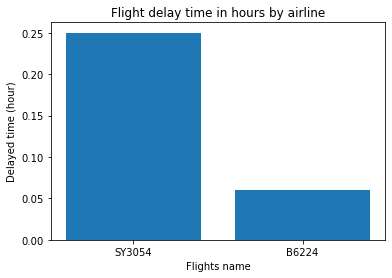

In [14]:
plt.bar(df['Flights name'], np.divide(df['Delayed time (seconds)'], 3600))
plt.xlabel('Flights name')
plt.ylabel('Delayed time (hour)')
plt.title('Flight delay time in hours by airline')
plt.show()
# Create a bar graph using the DataFrame (Flights name) and divide the delayed time by 3600 into hours.
# Label the x-axis (Flights name).
# Label the y-axis (Delayed time).
# Label the title (Flight delay time in hours by airline).
# Perform and start the event loop.

In [15]:
airlinelist = []
for value in arrivals:
    if value['flight']['owner']!=None:
        airlinelist.append(value['flight']['owner']['name'])
# Use the for loop to iterate number of arrivals.
# If there is no equal value for flight, owner, add to airlinelist.

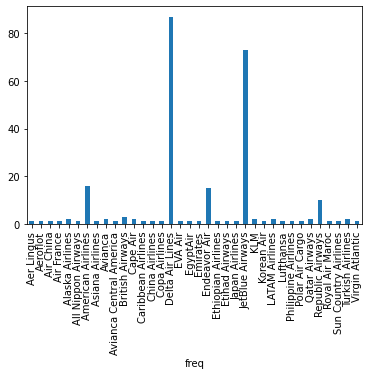

In [16]:
df = pd.DataFrame({'freq': airlinelist})
df.groupby('freq').size().plot(kind='bar')
plt.show()
# Group the DataFrame by frequency size/ plot a bar graph.

In [17]:
airlinelist = np.unique(airlinelist)
# Store unique values in airlinelist.
len(airlinelist)
# Return number of items in airlinelist.

36

### Part2 Conclusion

From the website flightrader24.com, we can access flight schedules such as arrival times and cancellation notifications (used the API form). 
 We found flight delay times that included flight names, airline carriers, and departure airport information. We also created a bar graph using numpy and pandas. We obtained the flight delay times in hours by airline carriers. 

# Project Part 3 : Data Combine, Merge, Load

In [18]:
result = []
for value in arrivals:
    value = value['flight']
    if value['time']['real']['departure']!=None:
        airline = value['airline']['name']
        filghtsname = value['identification']['number']['default']
        departureairport = value['airport']['origin']['code']['iata']
        result.append([filghtsname, airline, departureairport])
arrivaldf = pd.DataFrame(result)
arrivaldf.columns = ['Flights name', 'Airline', 'Departure airport']
arrivaldf['Destination airport']='JFK'
arrivaldf
# Use for loop to iterate the value in arrivals, if statement to add the result into list (flightsname, airline, departureairport).
# Store result into arrival DataFrame.
# Establish JFK airport as the arrival destination airport.

,Flights name,Airline,Departure airport,Destination airport
0,ET3906,Ethiopian Cargo,SCL,JFK
1,B61084,JetBlue Airways,MCO,JFK
2,DL5241,Delta Connection,DTW,JFK
3,OZ222,Asiana Airlines,ICN,JFK
4,B6402,JetBlue Airways,FLL,JFK
5,B6185,JetBlue Airways,ROC,JFK
6,9K929,Cape Air,MVY,JFK
7,B61274,JetBlue Airways,CHS,JFK
8,AA1140,American Airlines,MIA,JFK
9,D0850,DHL,ATL,JFK


In [19]:
result = []
for value in departures:
    value = value['flight']
    #if value['time']['real']['departure']!=None:.
    airline = value['airline']['name']
    filghtsname = value['identification']['number']['default']
    departureairport = value['airport']['destination']['code']['iata']
    result.append([filghtsname, airline, departureairport])
departuresdf = pd.DataFrame(result)
departuresdf.columns = ['Flights name', 'Airline', 'Destination airport']
departuresdf['Departure airport']='JFK'
departuresdf
# Use for loop to iterate the value in arrivals, if statement to add the result into list (flightsname, airline, departureairport).
# Store result into departures DataFrame.
# Establish JFK airport as the departure airport.

,Flights name,Airline,Destination airport,Departure airport
0,AS7,Alaska Airlines,SEA,JFK
1,CA1050,Air China Cargo,ANC,JFK
2,DL640,Delta Air Lines,SJU,JFK
3,B6702,JetBlue Airways,BUF,JFK
4,SA204,South African Airways,JNB,JFK
...,...,...,...,...
295,KE82,Korean Air,ICN,JFK
296,9K117,Cape Air,MVY,JFK
297,2D661,Eastern Airlines,PAP,JFK
298,AA458,American Airlines,CLT,JFK


In [20]:
arrivaldf.merge(departuresdf, on='Airline')
# Merge the arrivalDataFrame with departuresDataFrame, on JFK.

,Flights name_x,Airline,Departure airport_x,Destination airport_x,Flights name_y,Destination airport_y,Departure airport_y
0,B61084,JetBlue Airways,MCO,JFK,B6702,BUF,JFK
1,B61084,JetBlue Airways,MCO,JFK,B62003,SJU,JFK
2,B61084,JetBlue Airways,MCO,JFK,B6109,SDQ,JFK
3,B61084,JetBlue Airways,MCO,JFK,B6789,MCO,JFK
4,B61084,JetBlue Airways,MCO,JFK,B6637,STI,JFK
...,...,...,...,...,...,...,...
1763,KL641,KLM,AMS,JFK,KL644,AMS,JFK
1764,TK1,Turkish Airlines,IST,JFK,TK12,IST,JFK
1765,TK1,Turkish Airlines,IST,JFK,TK6558,ISL,JFK
1766,BR32,EVA Air,TPE,JFK,BR31,TPE,JFK


In [21]:
pd.concat([arrivaldf, departuresdf])
# Link arrivalDataFrame and depaturesDataFrame (linking columns/ multindex).

,Flights name,Airline,Departure airport,Destination airport
0,ET3906,Ethiopian Cargo,SCL,JFK
1,B61084,JetBlue Airways,MCO,JFK
2,DL5241,Delta Connection,DTW,JFK
3,OZ222,Asiana Airlines,ICN,JFK
4,B6402,JetBlue Airways,FLL,JFK
...,...,...,...,...
295,KE82,Korean Air,JFK,ICN
296,9K117,Cape Air,JFK,MVY
297,2D661,Eastern Airlines,JFK,PAP
298,AA458,American Airlines,JFK,CLT


### Part3 Conclusion

Here, we took the data from the airport departure and combined it with the arrival and destination airport information. To be more specific, we appended the flights name, airline, and departure airport to configure our data frame.  One important matter in part 3 is that we merged two dataframes (used arrivaldf.merge to combine the departuredf and arrivaldf). 

# Project Part4 : Data Load Process

In [22]:
import csv
import pandas as pd
with open('C:/Users/Hyuntae/Desktop/jfk_flights.csv', newline='') as csvfile:
    data2 = csv.reader(csvfile, delimiter = ',')
    for row in data2:
        print(', '.join(row))
# Process database/spreadsheet files (CSV).
# Process data analysis library using pandas.
# Open CSV file, return and read the file, comma used to separate fields (delimiter).
# Use for loop to iterate row in data2.

year, month, day, dep_time, dep_delay, arr_time, arr_delay, carrier, tailnum, flight, origin, dest, air_time, distance, hour, minute, JMPDate, DayOfWeek
2013, 1, 1, 542, 2, 923, 33, AA, N619AA, 1141, JFK, MIA, 160, 1089, 5, 42, 3439843200, 3
2013, 1, 1, 544, -1, 1004, -18, B6, N804JB, 725, JFK, BQN, 183, 1576, 5, 44, 3439843200, 3
2013, 1, 1, 557, -3, 838, -8, B6, N593JB, 79, JFK, MCO, 140, 944, 5, 57, 3439843200, 3
2013, 1, 1, 558, -2, 849, -2, B6, N793JB, 49, JFK, PBI, 149, 1028, 5, 58, 3439843200, 3
2013, 1, 1, 558, -2, 853, -3, B6, N657JB, 71, JFK, TPA, 158, 1005, 5, 58, 3439843200, 3
2013, 1, 1, 558, -2, 924, 7, UA, N29129, 194, JFK, LAX, 345, 2475, 5, 58, 3439843200, 3
2013, 1, 1, 559, 0, 702, -4, B6, N708JB, 1806, JFK, BOS, 44, 187, 5, 59, 3439843200, 3
2013, 1, 1, 606, -4, 837, -8, DL, N3739P, 1743, JFK, ATL, 128, 760, 6, 6, 3439843200, 3
2013, 1, 1, 611, 11, 945, 14, UA, N532UA, 303, JFK, SFO, 366, 2586, 6, 11, 3439843200, 3
2013, 1, 1, 613, 3, 925, 4, B6, N635JB, 135, JFK, RS

2013, 1, 8, 713, -2, 1029, -16, AA, N336AA, 443, JFK, MIA, 151, 1089, 7, 13, 3440448000, 3
2013, 1, 8, 714, -1, 1045, 5, UA, N532UA, 799, JFK, SFO, 354, 2586, 7, 14, 3440448000, 3
2013, 1, 8, 726, -3, 841, -9, B6, N334JB, 1305, JFK, IAD, 46, 228, 7, 26, 3440448000, 3
2013, 1, 8, 729, -1, 1036, -24, AA, N335AA, 33, JFK, LAX, 330, 2475, 7, 29, 3440448000, 3
2013, 1, 8, 729, -6, 1034, -13, B6, N583JB, 341, JFK, SRQ, 157, 1041, 7, 29, 3440448000, 3
2013, 1, 8, 730, 0, 1056, -19, VX, N841VA, 11, JFK, SFO, 348, 2586, 7, 30, 3440448000, 3
2013, 1, 8, 732, -8, 1048, -17, DL, N727TW, 1889, JFK, SEA, 350, 2422, 7, 32, 3440448000, 3
2013, 1, 8, 735, -15, 912, -28, 9E, N833AY, 3611, JFK, PIT, 69, 340, 7, 35, 3440448000, 3
2013, 1, 8, 736, 26, 1213, 10, B6, N569JB, 715, JFK, SJU, 194, 1598, 7, 36, 3440448000, 3
2013, 1, 8, 741, -4, 1058, -27, AA, N327AA, 59, JFK, SFO, 351, 2586, 7, 41, 3440448000, 3
2013, 1, 8, 749, -8, 901, -9, B6, N592JB, 44, JFK, SYR, 49, 209, 7, 49, 3440448000, 3
2013, 1, 8, 75

2013, 1, 13, 1743, -2, 2040, -37, DL, N3753, 1394, JFK, PDX, 319, 2454, 17, 43, 3440880000, 1
2013, 1, 13, 1745, 70, 1940, 59, B6, N266JB, 1085, JFK, CLT, 86, 541, 17, 45, 3440880000, 1
2013, 1, 13, 1745, 20, 1939, 44, MQ, N819MQ, 4255, JFK, BNA, 145, 765, 17, 45, 3440880000, 1
2013, 1, 13, 1747, -3, 1853, -15, B6, N337JB, 1307, JFK, IAD, 46, 228, 17, 47, 3440880000, 1
2013, 1, 13, 1747, -4, 2101, -2, UA, N525UA, 535, JFK, LAX, 348, 2475, 17, 47, 3440880000, 1
2013, 1, 13, 1748, 43, 2025, 17, B6, N570JB, 143, JFK, PBI, 137, 1028, 17, 48, 3440880000, 1
2013, 1, 13, 1751, 96, 1941, 86, 9E, N904XJ, 3387, JFK, RDU, 68, 427, 17, 51, 3440880000, 1
2013, 1, 13, 1755, 0, 2045, -24, B6, N653JB, 989, JFK, FLL, 148, 1069, 17, 55, 3440880000, 1
2013, 1, 13, 1758, 58, 2003, 83, MQ, N688MQ, 4323, JFK, ORF, 53, 290, 17, 58, 3440880000, 1
2013, 1, 13, 1759, 60, 2134, 48, 9E, N934XJ, 3375, JFK, SAT, 254, 1587, 17, 59, 3440880000, 1
2013, 1, 13, 1803, -7, 2034, -3, 9E, N602LR, 3542, JFK, MSP, 157, 1029,

2013, 1, 19, 1651, -8, 2000, -44, 9E, N914XJ, 3375, JFK, SAT, 233, 1587, 16, 51, 3441398400, 7
2013, 1, 19, 1654, 54, 1918, 28, DL, N392DA, 1331, JFK, DEN, 239, 1626, 16, 54, 3441398400, 7
2013, 1, 19, 1657, -3, 1939, -11, AA, N5BSAA, 575, JFK, EGE, 256, 1747, 16, 57, 3441398400, 7
2013, 1, 19, 1658, -2, 1806, -34, MQ, N606MQ, 4323, JFK, ORF, 53, 290, 16, 58, 3441398400, 7
2013, 1, 19, 1700, -5, 1958, -42, DL, N705TW, 127, JFK, LAX, 325, 2475, 17, 0, 3441398400, 7
2013, 1, 19, 1703, 3, 1942, -13, AA, N3AUAA, 257, JFK, LAS, 315, 2248, 17, 3, 3441398400, 7
2013, 1, 19, 1706, -4, 2020, 5, AA, N3BUAA, 695, JFK, AUS, 225, 1521, 17, 6, 3441398400, 7
2013, 1, 19, 1706, 31, 1902, 21, B6, N190JB, 1085, JFK, CLT, 88, 541, 17, 6, 3441398400, 7
2013, 1, 19, 1707, -8, 1956, -44, DL, N3769L, 503, JFK, SAN, 328, 2446, 17, 7, 3441398400, 7
2013, 1, 19, 1708, 8, 2150, -14, DL, N3750D, 329, JFK, SJU, 196, 1598, 17, 8, 3441398400, 7
2013, 1, 19, 1708, 0, 2008, -15, B6, N266JB, 15, JFK, FLL, 158, 1069, 17

2013, 1, 25, 743, -4, 1120, -6, B6, N652JB, 643, JFK, SFO, 374, 2586, 7, 43, 3441916800, 6
2013, 1, 25, 753, -4, 900, -10, B6, N637JB, 44, JFK, SYR, 46, 209, 7, 53, 3441916800, 6
2013, 1, 25, 755, -5, 1053, -29, DL, N990DL, 1271, JFK, FLL, 151, 1069, 7, 55, 3441916800, 6
2013, 1, 25, 759, -1, 1108, -16, DL, N361NW, 2143, JFK, MIA, 159, 1089, 7, 59, 3441916800, 6
2013, 1, 25, 759, 9, 942, 2, 9E, N8718E, 3611, JFK, PIT, 68, 340, 7, 59, 3441916800, 6
2013, 1, 25, 801, -4, 1015, -14, 9E, N937XJ, 3538, JFK, MSP, 160, 1029, 8, 1, 3441916800, 6
2013, 1, 25, 801, -4, 1047, -26, B6, N657JB, 17, JFK, FLL, 145, 1069, 8, 1, 3441916800, 6
2013, 1, 25, 803, -4, 1027, 17, B6, N298JB, 219, JFK, CLT, 94, 541, 8, 3, 3441916800, 6
2013, 1, 25, 805, -5, 1101, -15, DL, N969DL, 1959, JFK, MCO, 136, 944, 8, 5, 3441916800, 6
2013, 1, 25, 805, 70, 1136, 66, DL, N3739P, 1415, JFK, SLC, 290, 1990, 8, 5, 3441916800, 6
2013, 1, 25, 806, -9, 1059, -32, DL, N301DQ, 1167, JFK, TPA, 146, 1005, 8, 6, 3441916800, 6
2013

2013, 1, 30, 1345, -5, 1615, -9, B6, N329JB, 615, JFK, JAX, 126, 828, 13, 45, 3442348800, 4
2013, 1, 30, 1348, 23, 1818, 8, B6, N649JB, 705, JFK, SJU, 190, 1598, 13, 48, 3442348800, 4
2013, 1, 30, 1356, 121, 1459, 115, 9E, N935XJ, 3483, JFK, BOS, 41, 187, 13, 56, 3442348800, 4
2013, 1, 30, 1402, -3, 1656, -9, B6, N639JB, 63, JFK, TPA, 154, 1005, 14, 2, 3442348800, 4
2013, 1, 30, 1426, -3, 1801, 7, UA, N502UA, 257, JFK, SFO, 363, 2586, 14, 26, 3442348800, 4
2013, 1, 30, 1437, 38, 1559, 42, EV, N832AS, 5712, JFK, IAD, 54, 228, 14, 37, 3442348800, 4
2013, 1, 30, 1438, 23, 1544, 18, B6, N239JB, 1010, JFK, BOS, 41, 187, 14, 38, 3442348800, 4
2013, 1, 30, 1439, -6, 1725, -20, B6, N597JB, 153, JFK, MCO, 144, 944, 14, 39, 3442348800, 4
2013, 1, 30, 1445, 15, 1750, -25, DL, N721TW, 2126, JFK, SFO, 336, 2586, 14, 45, 3442348800, 4
2013, 1, 30, 1446, -4, 1629, -16, MQ, N680MQ, 4172, JFK, CLE, 78, 425, 14, 46, 3442348800, 4
2013, 1, 30, 1449, -1, 1635, -5, MQ, N855MQ, 4403, JFK, RDU, 77, 427, 14, 

2013, 10, 4, 1348, -2, 1614, -29, B6, N568JB, 1783, JFK, MCO, 122, 944, 13, 48, 3463689600, 6
2013, 10, 4, 1349, -10, 1512, 1, B6, N355JB, 118, JFK, BOS, 42, 187, 13, 49, 3463689600, 6
2013, 10, 4, 1355, -4, 1537, -28, B6, N198JB, 1373, JFK, CHS, 87, 636, 13, 55, 3463689600, 6
2013, 10, 4, 1412, 13, 1729, 26, B6, N821JB, 213, JFK, LGB, 343, 2465, 14, 12, 3463689600, 6
2013, 10, 4, 1425, -4, 1533, -15, B6, N316JB, 286, JFK, ROC, 55, 264, 14, 25, 3463689600, 6
2013, 10, 4, 1433, -3, 1809, -26, B6, N636JB, 703, JFK, SJU, 201, 1598, 14, 33, 3463689600, 6
2013, 10, 4, 1434, 5, 1636, -19, B6, N192JB, 477, JFK, JAX, 106, 828, 14, 34, 3463689600, 6
2013, 10, 4, 1437, 8, 1724, -6, B6, N579JB, 301, JFK, FLL, 138, 1069, 14, 37, 3463689600, 6
2013, 10, 4, 1442, -3, 1734, -24, UA, N590UA, 841, JFK, LAX, 327, 2475, 14, 42, 3463689600, 6
2013, 10, 4, 1443, -1, 1551, -33, 9E, N924XJ, 3393, JFK, DCA, 40, 213, 14, 43, 3463689600, 6
2013, 10, 4, 1446, -9, 1621, -19, MQ, N813MQ, 3359, JFK, RDU, 67, 427, 1

2013, 10, 10, 1909, 9, 2117, -16, DL, N3756, 245, JFK, PHX, 288, 2153, 19, 9, 3464208000, 5
2013, 10, 10, 1910, 5, 2139, 8, DL, N376DA, 2454, JFK, DEN, 216, 1626, 19, 10, 3464208000, 5
2013, 10, 10, 1914, -5, 2211, -23, B6, N563JB, 71, JFK, SLC, 268, 1990, 19, 14, 3464208000, 5
2013, 10, 10, 1917, -2, 2148, -27, DL, N975DL, 2159, JFK, MCO, 127, 944, 19, 17, 3464208000, 5
2013, 10, 10, 1929, -1, 2216, -34, AA, N3CFAA, 235, JFK, SEA, 313, 2422, 19, 29, 3464208000, 5
2013, 10, 10, 1930, -10, 2043, -17, EV, N834AS, 5714, JFK, IAD, 51, 228, 19, 30, 3464208000, 5
2013, 10, 10, 1937, 2, 2214, -15, B6, N585JB, 225, JFK, TPA, 134, 1005, 19, 37, 3464208000, 5
2013, 10, 10, 1937, -3, 2238, -14, B6, N775JB, 161, JFK, SMF, 333, 2521, 19, 37, 3464208000, 5
2013, 10, 10, 1940, 15, 2128, -23, 9E, N914XJ, 3304, JFK, MSY, 145, 1182, 19, 40, 3464208000, 5
2013, 10, 10, 1940, 40, 2111, 14, 9E, N931XJ, 3330, JFK, ORD, 107, 740, 19, 40, 3464208000, 5
2013, 10, 10, 1942, 42, 2229, 38, B6, N625JB, 883, JFK, M

2013, 10, 15, 829, -1, 1126, 4, UA, N597UA, 443, JFK, LAX, 329, 2475, 8, 29, 3464640000, 3
2013, 10, 15, 830, -2, 946, -14, 9E, N916XJ, 3492, JFK, DCA, 44, 213, 8, 30, 3464640000, 3
2013, 10, 15, 841, -4, 935, -23, 9E, N8944B, 3841, JFK, PHL, 30, 94, 8, 41, 3464640000, 3
2013, 10, 15, 844, 56, 1045, 60, B6, N258JB, 1273, JFK, CHS, 93, 636, 8, 44, 3464640000, 3
2013, 10, 15, 846, -4, 1147, 6, B6, N746JB, 189, JFK, SAN, 337, 2446, 8, 46, 3464640000, 3
2013, 10, 15, 847, -3, 941, -25, DL, N314NB, 2445, JFK, BOS, 32, 187, 8, 47, 3464640000, 3
2013, 10, 15, 849, -6, 1249, -2, DL, N3759, 301, JFK, SJU, 213, 1598, 8, 49, 3464640000, 3
2013, 10, 15, 854, 0, 1207, -6, B6, N652JB, 15, JFK, SFO, 350, 2586, 8, 54, 3464640000, 3
2013, 10, 15, 857, -3, 1135, -22, B6, N640JB, 63, JFK, SEA, 302, 2422, 8, 57, 3464640000, 3
2013, 10, 15, 857, -2, 1139, -18, B6, N661JB, 795, JFK, AUS, 203, 1521, 8, 57, 3464640000, 3
2013, 10, 15, 857, -3, 1224, -4, DL, N711ZX, 431, JFK, SFO, 345, 2586, 8, 57, 3464640000,

2013, 10, 20, 1244, 12, 1543, 13, B6, N655JB, 1401, JFK, FLL, 158, 1069, 12, 44, 3465072000, 1
2013, 10, 20, 1245, -2, 1539, 4, B6, N638JB, 553, JFK, PBI, 152, 1028, 12, 45, 3465072000, 1
2013, 10, 20, 1246, -10, 1553, -9, DL, N3756, 1375, JFK, SLC, 281, 1990, 12, 46, 3465072000, 1
2013, 10, 20, 1252, 7, 1553, -7, AA, N642AA, 1697, JFK, MIA, 160, 1089, 12, 52, 3465072000, 1
2013, 10, 20, 1254, -6, 1601, -21, DL, N174DN, 432, JFK, SFO, 345, 2586, 12, 54, 3465072000, 1
2013, 10, 20, 1256, -4, 1557, -13, VX, N625VA, 411, JFK, LAX, 342, 2475, 12, 56, 3465072000, 1
2013, 10, 20, 1300, 0, 1351, -16, B6, N373JB, 1318, JFK, BOS, 33, 187, 13, 0, 3465072000, 1
2013, 10, 20, 1321, -4, 1426, -8, B6, N323JB, 308, JFK, PWM, 45, 273, 13, 21, 3465072000, 1
2013, 10, 20, 1323, -5, 1618, 18, B6, N637JB, 1311, JFK, LAS, 311, 2248, 13, 23, 3465072000, 1
2013, 10, 20, 1326, -4, 1547, -3, US, N601AW, 456, JFK, PHX, 295, 2153, 13, 26, 3465072000, 1
2013, 10, 20, 1327, -3, 1551, -2, DL, N336NB, 2043, JFK, ATL

2013, 10, 26, 640, -5, 928, -10, B6, N763JB, 525, JFK, TPA, 143, 1005, 6, 40, 3465590400, 7
2013, 10, 26, 642, -3, 931, -6, B6, N517JB, 453, JFK, PBI, 142, 1028, 6, 42, 3465590400, 7
2013, 10, 26, 652, -8, 1055, -1, B6, N589JB, 3, JFK, SJU, 204, 1598, 6, 52, 3465590400, 7
2013, 10, 26, 654, -6, 949, -26, VX, N849VA, 399, JFK, LAX, 330, 2475, 6, 54, 3465590400, 7
2013, 10, 26, 654, -6, 945, -4, B6, N519JB, 683, JFK, MCO, 137, 944, 6, 54, 3465590400, 7
2013, 10, 26, 655, -5, 941, -22, B6, N804JB, 23, JFK, LAX, 323, 2475, 6, 55, 3465590400, 7
2013, 10, 26, 656, -4, 1013, -12, DL, N713TW, 269, JFK, SFO, 351, 2586, 6, 56, 3465590400, 7
2013, 10, 26, 656, 1, 1042, -17, DL, N6703D, 315, JFK, SJU, 195, 1598, 6, 56, 3465590400, 7
2013, 10, 26, 656, -5, 944, -29, DL, N721TW, 420, JFK, LAX, 316, 2475, 6, 56, 3465590400, 7
2013, 10, 26, 656, -8, 957, -28, DL, N705TW, 1415, JFK, SLC, 273, 1990, 6, 56, 3465590400, 7
2013, 10, 26, 703, 33, 954, 32, UA, N502UA, 797, JFK, LAX, 316, 2475, 7, 3, 34655904

2013, 10, 31, 1153, -7, 1425, -19, B6, N633JB, 1711, JFK, LAS, 311, 2248, 11, 53, 3466022400, 5
2013, 10, 31, 1155, -5, 1453, -13, DL, N722TW, 423, JFK, LAX, 322, 2475, 11, 55, 3466022400, 5
2013, 10, 31, 1155, 4, 1442, -17, B6, N524JB, 323, JFK, LAX, 324, 2475, 11, 55, 3466022400, 5
2013, 10, 31, 1156, -4, 1342, -16, US, N128UW, 2069, JFK, CLT, 86, 541, 11, 56, 3466022400, 5
2013, 10, 31, 1157, -3, 1302, -10, DL, N349NB, 2451, JFK, BOS, 42, 187, 11, 57, 3466022400, 5
2013, 10, 31, 1159, -1, 1449, -6, AA, N329AA, 3, JFK, LAX, 321, 2475, 11, 59, 3466022400, 5
2013, 10, 31, 1200, 0, 1452, -23, UA, N502UA, 766, JFK, SFO, 328, 2586, 12, 0, 3466022400, 5
2013, 10, 31, 1208, 10, 1455, -11, B6, N630JB, 1129, JFK, RSW, 153, 1074, 12, 8, 3466022400, 5
2013, 10, 31, 1216, -4, 1337, -18, MQ, N804MQ, 3361, JFK, RDU, 68, 427, 12, 16, 3466022400, 5
2013, 10, 31, 1218, 19, 1317, 8, MQ, N829MQ, 3386, JFK, DCA, 46, 213, 12, 18, 3466022400, 5
2013, 10, 31, 1228, -1, 1354, 9, B6, N329JB, 1386, JFK, ROC, 

2013, 11, 5, 626, -4, 855, -6, DL, N3753, 1214, JFK, ATL, 116, 760, 6, 26, 3466454400, 3
2013, 11, 5, 627, -8, 907, -22, B6, N648JB, 525, JFK, TPA, 140, 1005, 6, 27, 3466454400, 3
2013, 11, 5, 628, -2, 803, -3, B6, N216JB, 905, JFK, ORD, 130, 740, 6, 28, 3466454400, 3
2013, 11, 5, 633, -6, 952, -10, UA, N588UA, 398, JFK, LAX, 349, 2475, 6, 33, 3466454400, 3
2013, 11, 5, 645, 0, 852, -15, B6, N283JB, 675, JFK, MSY, 167, 1182, 6, 45, 3466454400, 3
2013, 11, 5, 649, -1, 740, -19, B6, N279JB, 318, JFK, BOS, 35, 187, 6, 49, 3466454400, 3
2013, 11, 5, 651, -4, 946, 26, AA, N613AA, 1263, JFK, LAS, 329, 2248, 6, 51, 3466454400, 3
2013, 11, 5, 651, -9, 1022, 2, DL, N712TW, 1415, JFK, SLC, 300, 1990, 6, 51, 3466454400, 3
2013, 11, 5, 652, -8, 1042, 27, B6, N828JB, 23, JFK, LAX, 361, 2475, 6, 52, 3466454400, 3
2013, 11, 5, 652, -8, 1023, 8, VX, N632VA, 399, JFK, LAX, 362, 2475, 6, 52, 3466454400, 3
2013, 11, 5, 653, -2, 1131, -19, DL, N393DA, 315, JFK, SJU, 183, 1598, 6, 53, 3466454400, 3
2013, 1

2013, 11, 10, 757, -8, 1040, -24, DL, N303DQ, 346, JFK, TPA, 146, 1005, 7, 57, 3466886400, 1
2013, 11, 10, 757, -3, 1044, -16, AA, N335AA, 33, JFK, LAX, 328, 2475, 7, 57, 3466886400, 1
2013, 11, 10, 802, 2, 1243, -12, AA, N5ETAA, 936, JFK, STT, 193, 1623, 8, 2, 3466886400, 1
2013, 11, 10, 804, -6, 1103, -13, DL, N3771K, 857, JFK, SAN, 333, 2446, 8, 4, 3466886400, 1
2013, 11, 10, 805, 5, 1122, -14, UA, N596UA, 397, JFK, SFO, 354, 2586, 8, 5, 3466886400, 1
2013, 11, 10, 805, -6, 1039, -27, B6, N531JB, 1783, JFK, MCO, 136, 944, 8, 5, 3466886400, 1
2013, 11, 10, 806, -9, 924, -28, 9E, N605LR, 2906, JFK, BUF, 59, 301, 8, 6, 3466886400, 1
2013, 11, 10, 806, -9, 1047, -5, DL, N655DL, 1429, JFK, LAS, 317, 2248, 8, 6, 3466886400, 1
2013, 11, 10, 810, -5, 1105, -18, B6, N283JB, 281, JFK, HOU, 218, 1428, 8, 10, 3466886400, 1
2013, 11, 10, 814, 7, 1102, -10, DL, N983DL, 1271, JFK, FLL, 148, 1069, 8, 14, 3466886400, 1
2013, 11, 10, 815, -5, 1251, -39, AA, N5FJAA, 1357, JFK, SJU, 190, 1598, 8, 15, 3

2013, 11, 15, 921, 6, 1250, 20, VX, N621VA, 407, JFK, LAX, 351, 2475, 9, 21, 3467318400, 6
2013, 11, 15, 930, -6, 1033, -19, B6, N283JB, 116, JFK, SYR, 40, 209, 9, 30, 3467318400, 6
2013, 11, 15, 945, -2, 1407, -23, B6, N510JB, 403, JFK, SJU, 179, 1598, 9, 45, 3467318400, 6
2013, 11, 15, 945, -4, 1241, 4, B6, N585JB, 483, JFK, MCO, 145, 944, 9, 45, 3467318400, 6
2013, 11, 15, 951, -9, 1545, -10, HA, N386HA, 51, JFK, HNL, 633, 4983, 9, 51, 3467318400, 6
2013, 11, 15, 956, -4, 1255, 10, B6, N558JB, 411, JFK, LAS, 324, 2248, 9, 56, 3467318400, 6
2013, 11, 15, 959, -1, 1312, -21, DL, N706TW, 469, JFK, SFO, 346, 2586, 9, 59, 3467318400, 6
2013, 11, 15, 1009, -6, 1209, -9, US, N153UW, 893, JFK, CLT, 100, 541, 10, 9, 3467318400, 6
2013, 11, 15, 1019, -6, 1330, -30, UA, N597UA, 642, JFK, SFO, 350, 2586, 10, 19, 3467318400, 6
2013, 11, 15, 1022, -3, 1114, -13, B6, N354JB, 518, JFK, BOS, 38, 187, 10, 22, 3467318400, 6
2013, 11, 15, 1026, -4, 1321, -4, AA, N336AA, 19, JFK, LAX, 341, 2475, 10, 26,

2013, 11, 20, 743, 8, 932, -17, 9E, N933XJ, 2916, JFK, DTW, 88, 509, 7, 43, 3467750400, 4
2013, 11, 20, 744, -11, 940, -20, B6, N328JB, 1273, JFK, CHS, 95, 636, 7, 44, 3467750400, 4
2013, 11, 20, 746, 1, 1140, 40, AA, N382AA, 59, JFK, SFO, 391, 2586, 7, 46, 3467750400, 4
2013, 11, 20, 749, -6, 901, -9, MQ, N848MQ, 3370, JFK, DCA, 44, 213, 7, 49, 3467750400, 4
2013, 11, 20, 750, 0, 1045, 5, MQ, N546MQ, 3052, JFK, TPA, 149, 1005, 7, 50, 3467750400, 4
2013, 11, 20, 751, -4, 933, -2, MQ, N816MQ, 3363, JFK, RDU, 70, 427, 7, 51, 3467750400, 4
2013, 11, 20, 751, -9, 944, -32, 9E, N921XJ, 2921, JFK, MSP, 148, 1029, 7, 51, 3467750400, 4
2013, 11, 20, 752, -3, 931, -11, 9E, N8977A, 2939, JFK, PIT, 67, 340, 7, 52, 3467750400, 4
2013, 11, 20, 754, -6, 1035, -35, DL, N3754A, 2190, JFK, MIA, 146, 1089, 7, 54, 3467750400, 4
2013, 11, 20, 754, -6, 1053, -7, AA, N319AA, 33, JFK, LAX, 333, 2475, 7, 54, 3467750400, 4
2013, 11, 20, 758, -7, 1038, -26, DL, N301DQ, 346, JFK, TPA, 145, 1005, 7, 58, 346775040

2013, 11, 25, 1513, 13, 1823, -7, DL, N721TW, 419, JFK, SEA, 343, 2422, 15, 13, 3468182400, 2
2013, 11, 25, 1517, 2, 1653, -12, MQ, N925MQ, 3231, JFK, PIT, 69, 340, 15, 17, 3468182400, 2
2013, 11, 25, 1523, 37, 1821, 28, B6, N519JB, 325, JFK, TPA, 153, 1005, 15, 23, 3468182400, 2
2013, 11, 25, 1523, 28, 1709, 14, MQ, N652MQ, 2815, JFK, CLE, 82, 425, 15, 23, 3468182400, 2
2013, 11, 25, 1525, 5, 1708, 7, 9E, N8577D, 2958, JFK, ROC, 51, 264, 15, 25, 3468182400, 2
2013, 11, 25, 1525, -5, 1800, -29, B6, N794JB, 83, JFK, MCO, 136, 944, 15, 25, 3468182400, 2
2013, 11, 25, 1526, -4, 1850, -11, DL, N191DN, 417, JFK, LAX, 343, 2475, 15, 26, 3468182400, 2
2013, 11, 25, 1527, -3, 1840, -25, UA, N546UA, 257, JFK, SFO, 348, 2586, 15, 27, 3468182400, 2
2013, 11, 25, 1531, 1, 1853, -22, AA, N342AA, 85, JFK, SFO, 357, 2586, 15, 31, 3468182400, 2
2013, 11, 25, 1531, -4, 1841, -16, B6, N179JB, 1729, JFK, RSW, 166, 1074, 15, 31, 3468182400, 2
2013, 11, 25, 1533, -7, 1857, -13, AA, N3FFAA, 65, JFK, DFW, 22

2013, 11, 30, 1246, -4, 1542, -22, DL, N3772H, 1375, JFK, SLC, 273, 1990, 12, 46, 3468614400, 7
2013, 11, 30, 1257, -3, 1532, 7, DL, N305DQ, 2043, JFK, ATL, 112, 760, 12, 57, 3468614400, 7
2013, 11, 30, 1257, -3, 1612, -8, VX, N621VA, 411, JFK, LAX, 344, 2475, 12, 57, 3468614400, 7
2013, 11, 30, 1258, -2, 1409, -5, B6, N258JB, 34, JFK, BTV, 46, 266, 12, 58, 3468614400, 7
2013, 11, 30, 1301, 1, 1619, 4, B6, N821JB, 1023, JFK, LAX, 344, 2475, 13, 1, 3468614400, 7
2013, 11, 30, 1303, 16, 1409, 18, B6, N281JB, 1318, JFK, BOS, 33, 187, 13, 3, 3468614400, 7
2013, 11, 30, 1319, 4, 1654, -3, US, N653AW, 456, JFK, PHX, 315, 2153, 13, 19, 3468614400, 7
2013, 11, 30, 1324, -5, 1425, -15, B6, N329JB, 308, JFK, PWM, 45, 273, 13, 24, 3468614400, 7
2013, 11, 30, 1335, -10, 1525, -28, US, N715UW, 787, JFK, CLT, 90, 541, 13, 35, 3468614400, 7
2013, 11, 30, 1337, -8, 1642, -23, AA, N339AA, 117, JFK, LAX, 348, 2475, 13, 37, 3468614400, 7
2013, 11, 30, 1340, 92, 1614, 74, B6, N615JB, 53, JFK, PBI, 132, 10

2013, 12, 5, 759, -1, 856, -14, AA, N3GXAA, 84, JFK, BOS, 33, 187, 7, 59, 3469046400, 5
2013, 12, 5, 800, 0, 1044, -19, DL, N718TW, 425, JFK, MCO, 131, 944, 8, 0, 3469046400, 5
2013, 12, 5, 800, 0, 1201, 19, UA, N546UA, 397, JFK, SFO, 372, 2586, 8, 0, 3469046400, 5
2013, 12, 5, 802, -3, 1053, -18, DL, N306DQ, 2017, JFK, TPA, 141, 1005, 8, 2, 3469046400, 5
2013, 12, 5, 803, 3, , , 9E, N909XJ, 2924, JFK, MSY, , 1182, 8, 3, 3469046400, 5
2013, 12, 5, 809, -6, 1102, -33, DL, N991DL, 2087, JFK, FLL, 143, 1069, 8, 9, 3469046400, 5
2013, 12, 5, 809, -6, 1121, 7, DL, N643DL, 2596, JFK, LAS, 337, 2248, 8, 9, 3469046400, 5
2013, 12, 5, 811, -4, 1124, 1, B6, N316JB, 281, JFK, HOU, 217, 1428, 8, 11, 3469046400, 5
2013, 12, 5, 812, 7, 1248, -16, AA, N5FLAA, 1357, JFK, SJU, 179, 1598, 8, 12, 3469046400, 5
2013, 12, 5, 812, 1, 1056, -10, B6, N584JB, 1783, JFK, MCO, 127, 944, 8, 12, 3469046400, 5
2013, 12, 5, 814, -1, 1216, 101, 9E, N294PQ, 2921, JFK, MSP, 177, 1029, 8, 14, 3469046400, 5
2013, 12, 5, 

2013, 12, 10, 1046, 47, 1244, 88, EV, N826AS, 5711, JFK, IAD, 54, 228, 10, 46, 3469478400, 3
2013, 12, 10, 1048, 168, 1210, 180, AA, N3JRAA, 84, JFK, BOS, 35, 187, 10, 48, 3469478400, 3
2013, 12, 10, 1049, 144, 1208, 149, 9E, N913XJ, 2901, JFK, BOS, 35, 187, 10, 49, 3469478400, 3
2013, 12, 10, 1052, 12, 1456, 46, VX, N629VA, 23, JFK, SFO, 371, 2586, 10, 52, 3469478400, 3
2013, 12, 10, 1055, -5, 1440, 29, DL, N966DL, 499, JFK, FLL, 176, 1069, 10, 55, 3469478400, 3
2013, 12, 10, 1056, 116, 1559, 129, DL, N704X, 2444, JFK, SJU, 198, 1598, 10, 56, 3469478400, 3
2013, 12, 10, 1110, 30, 1311, 72, B6, N178JB, 2602, JFK, BUF, 66, 301, 11, 10, 3469478400, 3
2013, 12, 10, 1114, 19, 1455, 46, DL, N375DA, 457, JFK, SLC, 298, 1990, 11, 14, 3469478400, 3
2013, 12, 10, 1127, -2, 1529, 47, UA, N502UA, 703, JFK, LAX, 365, 2475, 11, 27, 3469478400, 3
2013, 12, 10, 1129, 59, 1510, 90, AA, N332AA, 19, JFK, LAX, 348, 2475, 11, 29, 3469478400, 3
2013, 12, 10, 1152, 172, 1612, 227, AA, N324AA, 1, JFK, LAX, 3

2013, 12, 15, 1859, -1, 2206, -31, DL, N361NW, 2594, JFK, SAT, 234, 1587, 18, 59, 3469910400, 1
2013, 12, 15, 1900, 0, 2357, -2, AA, N5DUAA, 1029, JFK, SJU, 204, 1598, 19, 0, 3469910400, 1
2013, 12, 15, 1902, 2, 2202, -13, AA, N324AA, 21, JFK, LAX, 335, 2475, 19, 2, 3469910400, 1
2013, 12, 15, 1902, 92, 2027, 73, B6, N304JB, 1185, JFK, RDU, 69, 427, 19, 2, 3469910400, 1
2013, 12, 15, 1903, 33, 2239, 44, DL, N3743H, 2598, JFK, MIA, 168, 1089, 19, 3, 3469910400, 1
2013, 12, 15, 1904, 17, 2235, 28, B6, N648JB, 263, JFK, SEA, 364, 2422, 19, 4, 3469910400, 1
2013, 12, 15, 1910, 0, 2216, -41, DL, N398DA, 460, JFK, PHX, 290, 2153, 19, 10, 3469910400, 1
2013, 12, 15, 1912, 37, 2130, 32, 9E, N910XJ, 2911, JFK, CVG, 107, 589, 19, 12, 3469910400, 1
2013, 12, 15, 1913, 13, 2047, 0, 9E, N8458A, 2943, JFK, RIC, 63, 288, 19, 13, 3469910400, 1
2013, 12, 15, 1914, -1, 2209, -10, DL, N909DL, 2159, JFK, MCO, 155, 944, 19, 14, 3469910400, 1
2013, 12, 15, 1917, 47, 2250, 72, B6, N558JB, 201, JFK, FLL, 186,

2013, 12, 20, 1051, 11, 1211, 12, B6, N178JB, 2602, JFK, BUF, 60, 301, 10, 51, 3470342400, 6
2013, 12, 20, 1057, -3, 1157, -13, MQ, N518MQ, 3230, JFK, DCA, 43, 213, 10, 57, 3470342400, 6
2013, 12, 20, 1058, -2, 1347, -11, DL, N921DL, 405, JFK, MCO, 139, 944, 10, 58, 3470342400, 6
2013, 12, 20, 1058, -2, 1424, 10, DL, N3747D, 457, JFK, SLC, 297, 1990, 10, 58, 3470342400, 6
2013, 12, 20, 1058, 43, 1249, 31, US, N183UW, 893, JFK, CLT, 86, 541, 10, 58, 3470342400, 6
2013, 12, 20, 1121, 51, 1402, 38, B6, N612JB, 925, JFK, TPA, 147, 1005, 11, 21, 3470342400, 6
2013, 12, 20, 1125, -4, 1425, -21, UA, N502UA, 785, JFK, LAX, 344, 2475, 11, 25, 3470342400, 6
2013, 12, 20, 1142, -5, 1452, -5, B6, N763JB, 323, JFK, LAX, 353, 2475, 11, 42, 3470342400, 6
2013, 12, 20, 1155, -5, 1507, -3, AA, N327AA, 3, JFK, LAX, 341, 2475, 11, 55, 3470342400, 6
2013, 12, 20, 1157, -3, 1255, -20, 9E, N933XJ, 2902, JFK, BOS, 37, 187, 11, 57, 3470342400, 6
2013, 12, 20, 1158, -2, 1308, 0, B6, N239JB, 316, JFK, SYR, 45, 

2013, 12, 25, 604, -7, 1051, -4, B6, N779JB, 1403, JFK, SJU, 190, 1598, 6, 4, 3470774400, 4
2013, 12, 25, 605, 5, 912, -25, UA, N596UA, 303, JFK, SFO, 345, 2586, 6, 5, 3470774400, 4
2013, 12, 25, 611, 0, 908, -4, B6, N804JB, 601, JFK, FLL, 153, 1069, 6, 11, 3470774400, 4
2013, 12, 25, 612, -3, 859, 7, DL, N3769L, 479, JFK, ATL, 127, 760, 6, 12, 3470774400, 4
2013, 12, 25, 620, 5, 818, 1, US, N151UW, 840, JFK, CLT, 96, 541, 6, 20, 3470774400, 4
2013, 12, 25, 628, -2, 932, -6, B6, N712JB, 929, JFK, RSW, 162, 1074, 6, 28, 3470774400, 4
2013, 12, 25, 630, -1, 924, -34, UA, N505UA, 398, JFK, LAX, 335, 2475, 6, 30, 3470774400, 4
2013, 12, 25, 632, -3, 927, -2, B6, N556JB, 525, JFK, TPA, 151, 1005, 6, 32, 3470774400, 4
2013, 12, 25, 647, -3, 920, -35, AA, N5CCAA, 2493, JFK, MCO, 137, 944, 6, 47, 3470774400, 4
2013, 12, 25, 653, -2, 941, 1, AA, N3KXAA, 1263, JFK, LAS, 316, 2248, 6, 53, 3470774400, 4
2013, 12, 25, 654, -2, 1118, -21, DL, N3764D, 2275, JFK, SJU, 187, 1598, 6, 54, 3470774400, 4
2

2013, 12, 29, 1524, 115, 1703, 143, B6, N216JB, 308, JFK, PWM, 40, 273, 15, 24, 3471120000, 1
2013, 12, 29, 1525, -5, 1859, 30, B6, N662JB, 83, JFK, MCO, 154, 944, 15, 25, 3471120000, 1
2013, 12, 29, 1525, -5, 1912, 3, UA, N589UA, 257, JFK, SFO, 339, 2586, 15, 25, 3471120000, 1
2013, 12, 29, 1527, 28, 2057, 64, B6, N903JB, 703, JFK, SJU, 199, 1598, 15, 27, 3471120000, 1
2013, 12, 29, 1530, 35, 1713, 48, MQ, N9EAMQ, 3425, JFK, DCA, 46, 213, 15, 30, 3471120000, 1
2013, 12, 29, 1531, 47, 1735, 90, B6, N249JB, 286, JFK, ROC, 54, 264, 15, 31, 3471120000, 1
2013, 12, 29, 1532, 2, 1931, 16, AA, N359AA, 85, JFK, SFO, 349, 2586, 15, 32, 3471120000, 1
2013, 12, 29, 1532, 17, 2058, 49, DL, N3754A, 2043, JFK, SJU, 196, 1598, 15, 32, 3471120000, 1
2013, 12, 29, 1539, -1, 2015, 65, AA, N3EUAA, 65, JFK, DFW, 240, 1391, 15, 39, 3471120000, 1
2013, 12, 29, 1540, -5, 1919, -1, AA, N319AA, 133, JFK, LAX, 335, 2475, 15, 40, 3471120000, 1
2013, 12, 29, 1541, 161, 1728, 194, B6, N355JB, 34, JFK, BTV, 42, 26

2013, 2, 3, 908, 3, 1101, 38, B6, N267JB, 56, JFK, BTV, 44, 266, 9, 8, 3442694400, 1
2013, 2, 3, 912, -3, 1134, 33, B6, N178JB, 1103, JFK, RDU, 71, 427, 9, 12, 3442694400, 1
2013, 2, 3, 915, 0, 1244, 19, B6, N603JB, 25, JFK, FLL, 150, 1069, 9, 15, 3442694400, 1
2013, 2, 3, 917, 17, 1235, 15, AA, N5CEAA, 647, JFK, MIA, 154, 1089, 9, 17, 3442694400, 1
2013, 2, 3, 917, -4, 1036, 7, B6, N652JB, 1004, JFK, BOS, 34, 187, 9, 17, 3442694400, 1
2013, 2, 3, 919, 19, 1245, 46, B6, N506JB, 59, JFK, TPA, 144, 1005, 9, 19, 3442694400, 1
2013, 2, 3, 921, -7, 1103, 12, B6, N556JB, 4, JFK, BUF, 54, 301, 9, 21, 3442694400, 1
2013, 2, 3, 923, -7, 1109, 6, 9E, N8423C, 3661, JFK, ROC, 51, 264, 9, 23, 3442694400, 1
2013, 2, 3, 932, -3, 1235, 4, B6, N593JB, 41, JFK, MCO, 136, 944, 9, 32, 3442694400, 1
2013, 2, 3, 933, -2, 1309, 34, VX, N845VA, 251, JFK, LAS, 334, 2248, 9, 33, 3442694400, 1
2013, 2, 3, 946, -4, 1106, 2, B6, N229JB, 600, JFK, PWM, 45, 273, 9, 46, 3442694400, 1
2013, 2, 3, 956, -3, 1349, 16, US

2013, 2, 8, , , , , DL, N3749D, 2159, JFK, MCO, , 944, , , 3443126400, 6
2013, 2, 8, , , , , DL, N377NW, 2190, JFK, MIA, , 1089, , , 3443126400, 6
2013, 2, 8, , , , , DL, N709TW, 2363, JFK, LAX, , 2475, , , 3443126400, 6
2013, 2, 8, , , , , DL, N323US, 2391, JFK, TPA, , 1005, , , 3443126400, 6
2013, 2, 8, , , , , VX, N841VA, 27, JFK, SFO, , 2586, , , 3443126400, 6
2013, 2, 8, , , , , VX, N623VA, 29, JFK, SFO, , 2586, , , 3443126400, 6
2013, 2, 8, , , , , VX, N631VA, 413, JFK, LAX, , 2475, , , 3443126400, 6
2013, 2, 8, , , , , VX, N635VA, 415, JFK, LAX, , 2475, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N518MQ, 3783, JFK, CMH, , 483, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N645MQ, 3944, JFK, BWI, , 184, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N527MQ, 3792, JFK, DCA, , 213, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N500MQ, 3823, JFK, DCA, , 213, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N691MQ, 4255, JFK, BNA, , 765, , , 3443126400, 6
2013, 2, 8, , , , , MQ, N688MQ, 4309, JFK, IND, , 

2013, 2, 14, 1326, -4, 1556, -9, DL, N3766, 2043, JFK, ATL, 120, 760, 13, 26, 3443644800, 5
2013, 2, 14, 1337, -3, 1618, -30, B6, N520JB, 83, JFK, SEA, 323, 2422, 13, 37, 3443644800, 5
2013, 2, 14, 1344, -1, 1704, -1, AA, N335AA, 117, JFK, LAX, 341, 2475, 13, 44, 3443644800, 5
2013, 2, 14, 1344, -1, 1637, -18, B6, N554JB, 209, JFK, LGB, 336, 2465, 13, 44, 3443644800, 5
2013, 2, 14, 1406, 11, 1713, 26, B6, N656JB, 1783, JFK, MCO, 162, 944, 14, 6, 3443644800, 5
2013, 2, 14, 1412, 18, 1519, 7, EV, N836AS, 5712, JFK, IAD, 46, 228, 14, 12, 3443644800, 5
2013, 2, 14, 1417, 77, 1512, 66, B6, N298JB, 1006, JFK, BOS, 35, 187, 14, 17, 3443644800, 5
2013, 2, 14, 1423, -2, 1750, 0, UA, N560UA, 820, JFK, SFO, 343, 2586, 14, 23, 3443644800, 5
2013, 2, 14, 1425, 25, 1534, 21, B6, N346JB, 602, JFK, PWM, 47, 273, 14, 25, 3443644800, 5
2013, 2, 14, 1431, -4, 1748, 4, B6, N273JB, 347, JFK, SRQ, 176, 1041, 14, 31, 3443644800, 5
2013, 2, 14, 1434, 4, 1745, -30, DL, N709TW, 2126, JFK, SFO, 345, 2586, 14, 34

2013, 2, 18, 1115, 5, 1224, 4, B6, N216JB, 24, JFK, BTV, 52, 266, 11, 15, 3443990400, 2
2013, 2, 18, 1124, 4, 1424, 2, B6, N505JB, 1, JFK, FLL, 150, 1069, 11, 24, 3443990400, 2
2013, 2, 18, 1125, -5, 1402, -28, DL, N970DL, 2297, JFK, MCO, 135, 944, 11, 25, 3443990400, 2
2013, 2, 18, 1128, -2, 1423, -23, UA, N505UA, 703, JFK, LAX, 337, 2475, 11, 28, 3443990400, 2
2013, 2, 18, 1149, -11, 1252, -23, MQ, N822MQ, 4425, JFK, DCA, 47, 213, 11, 49, 3443990400, 2
2013, 2, 18, 1151, -9, 1447, -23, AA, N324AA, 3, JFK, LAX, 339, 2475, 11, 51, 3443990400, 2
2013, 2, 18, 1154, -6, 1502, -27, DL, N706TW, 863, JFK, LAX, 338, 2475, 11, 54, 3443990400, 2
2013, 2, 18, 1155, 0, 1253, -11, 9E, N922XJ, 3289, JFK, BOS, 38, 187, 11, 55, 3443990400, 2
2013, 2, 18, 1207, 13, 1453, 6, B6, N178JB, 27, JFK, TPA, 147, 1005, 12, 7, 3443990400, 2
2013, 2, 18, 1212, -3, 1530, 14, B6, N228JB, 625, JFK, HOU, 230, 1428, 12, 12, 3443990400, 2
2013, 2, 18, 1214, 9, 1512, 1, B6, N806JB, 133, JFK, RSW, 160, 1074, 12, 14, 344

2013, 2, 23, 1749, 19, 1931, 35, B6, N516JB, 36, JFK, ROC, 50, 264, 17, 49, 3444422400, 7
2013, 2, 23, 1753, -7, 2032, 26, US, N523UW, 373, JFK, CLT, 107, 541, 17, 53, 3444422400, 7
2013, 2, 23, 1807, -3, 2145, 18, B6, N598JB, 217, JFK, LGB, 345, 2465, 18, 7, 3444422400, 7
2013, 2, 23, 1809, -6, 1953, 3, 9E, N8839E, 4277, JFK, ORF, 53, 290, 18, 9, 3444422400, 7
2013, 2, 23, 1816, 1, 2100, 20, 9E, N922XJ, 3542, JFK, MSP, 153, 1029, 18, 16, 3444422400, 7
2013, 2, 23, 1819, 44, 2223, 68, B6, N531JB, 179, JFK, PHX, 321, 2153, 18, 19, 3444422400, 7
2013, 2, 23, 1820, 17, 1959, 38, B6, N203JB, 1307, JFK, IAD, 56, 228, 18, 20, 3444422400, 7
2013, 2, 23, 1823, 3, 2144, -8, DL, N3752, 1043, JFK, SEA, 333, 2422, 18, 23, 3444422400, 7
2013, 2, 23, 1823, 8, 2053, 18, 9E, N927XJ, 3354, JFK, DTW, 98, 509, 18, 23, 3444422400, 7
2013, 2, 23, 1829, 9, 2000, 11, 9E, N8604C, 3843, JFK, SYR, 46, 209, 18, 29, 3444422400, 7
2013, 2, 23, 1834, -1, 2005, 15, MQ, N642MQ, 3944, JFK, BWI, 40, 184, 18, 34, 344442

2013, 2, 28, 2229, -1, 258, -14, B6, N523JB, 713, JFK, SJU, 193, 1598, 22, 29, 3444854400, 5
2013, 2, 28, 2239, -6, 2339, -15, B6, N197JB, 608, JFK, PWM, 44, 273, 22, 39, 3444854400, 5
2013, 2, 28, 2242, -8, 2350, -15, B6, N351JB, 30, JFK, ROC, 51, 264, 22, 42, 3444854400, 5
2013, 2, 28, 2245, 0, 5, 9, B6, N184JB, 128, JFK, BTV, 48, 266, 22, 45, 3444854400, 5
2013, 2, 28, 2254, -4, 10, -9, B6, N655JB, 112, JFK, BUF, 53, 301, 22, 54, 3444854400, 5
2013, 2, 28, 2257, 2, 2400, 3, B6, N807JB, 1018, JFK, BOS, 35, 187, 22, 57, 3444854400, 5
2013, 2, 28, 2323, 32, 18, 21, B6, N279JB, 22, JFK, SYR, 40, 209, 23, 23, 3444854400, 5
2013, 2, 28, 2342, -10, 413, -24, B6, N656JB, 739, JFK, PSE, 193, 1617, 23, 42, 3444854400, 5
2013, 2, 28, 2356, -2, 423, -15, B6, N646JB, 707, JFK, SJU, 192, 1598, 23, 56, 3444854400, 5
2013, 2, 28, 2359, 0, 443, 5, B6, N641JB, 727, JFK, BQN, 192, 1576, 23, 59, 3444854400, 5
2013, 2, 28, , , , , B6, N274JB, 27, JFK, TPA, , 1005, , , 3444854400, 5
2013, 2, 28, , , , , 

2013, 3, 6, 1633, 13, 2001, -2, US, N544UW, 35, JFK, PHX, 292, 2153, 16, 33, 3445372800, 4
2013, 3, 6, 1634, 26, 1802, -13, 9E, N930XJ, 3436, JFK, RDU, 66, 427, 16, 34, 3445372800, 4
2013, 3, 6, 1635, 5, 2007, -8, VX, N842VA, 27, JFK, SFO, 365, 2586, 16, 35, 3445372800, 4
2013, 3, 6, 1638, -7, 1948, -20, DL, N3753, 1394, JFK, PDX, 342, 2454, 16, 38, 3445372800, 4
2013, 3, 6, 1649, 4, 2022, 17, AA, N327AA, 181, JFK, LAX, 345, 2475, 16, 49, 3445372800, 4
2013, 3, 6, 1652, -8, 1936, -19, AA, N3FFAA, 257, JFK, LAS, 314, 2248, 16, 52, 3445372800, 4
2013, 3, 6, 1652, 54, 1754, 26, B6, N306JB, 12, JFK, SYR, 42, 209, 16, 52, 3445372800, 4
2013, 3, 6, 1655, 0, 2007, -20, DL, N320NB, 1367, JFK, SAT, 224, 1587, 16, 55, 3445372800, 4
2013, 3, 6, 1656, 71, 1959, 50, UA, N14121, 132, JFK, LAX, 339, 2475, 16, 56, 3445372800, 4
2013, 3, 6, 1657, -3, 1949, -1, AA, N5DCAA, 575, JFK, EGE, 261, 1746, 16, 57, 3445372800, 4
2013, 3, 6, 1657, -3, 1820, -20, MQ, N660MQ, 4323, JFK, ORF, 51, 290, 16, 57, 344537

2013, 3, 10, 2013, -2, 2119, -11, AA, N3DMAA, 1762, JFK, BOS, 39, 187, 20, 13, 3445718400, 1
2013, 3, 10, 2014, -1, 2246, -32, DL, N3743H, 1729, JFK, LAS, 303, 2248, 20, 14, 3445718400, 1
2013, 3, 10, 2014, -11, 2239, -50, UA, N554UA, 771, JFK, LAX, 296, 2475, 20, 14, 3445718400, 1
2013, 3, 10, 2022, -2, 2350, 10, B6, N216JB, 1069, JFK, AUS, 241, 1521, 20, 22, 3445718400, 1
2013, 3, 10, 2022, 47, 2323, 7, B6, N784JB, 645, JFK, SFO, 328, 2586, 20, 22, 3445718400, 1
2013, 3, 10, 2022, -3, 2127, -22, DL, N309US, 985, JFK, BOS, 41, 187, 20, 22, 3445718400, 1
2013, 3, 10, 2027, -3, 2248, -18, B6, N274JB, 619, JFK, JAX, 116, 828, 20, 27, 3445718400, 1
2013, 3, 10, 2030, 10, 2331, 4, B6, N506JB, 801, JFK, FLL, 141, 1069, 20, 30, 3445718400, 1
2013, 3, 10, 2035, 30, 2342, 12, VX, N642VA, 415, JFK, LAX, 320, 2475, 20, 35, 3445718400, 1
2013, 3, 10, 2037, -8, 2141, -38, 9E, N924XJ, 3395, JFK, DCA, 43, 213, 20, 37, 3445718400, 1
2013, 3, 10, 2037, 37, 2334, 35, B6, N535JB, 39, JFK, PBI, 133, 1028

2013, 3, 14, 2013, -2, 2133, 3, AA, N3GSAA, 1762, JFK, BOS, 43, 187, 20, 13, 3446064000, 5
2013, 3, 14, 2019, -5, 2302, -38, B6, N337JB, 1069, JFK, AUS, 195, 1521, 20, 19, 3446064000, 5
2013, 3, 14, 2022, -3, 2143, -6, DL, N324US, 985, JFK, BOS, 43, 187, 20, 22, 3446064000, 5
2013, 3, 14, 2023, -7, 2303, -3, B6, N317JB, 619, JFK, JAX, 123, 828, 20, 23, 3446064000, 5
2013, 3, 14, 2031, 61, 2226, 40, 9E, N825AY, 3798, JFK, CLT, 77, 541, 20, 31, 3446064000, 5
2013, 3, 14, 2034, 54, 2300, 29, 9E, N913XJ, 3340, JFK, JAX, 116, 828, 20, 34, 3446064000, 5
2013, 3, 14, 2035, 40, 2149, 18, 9E, N8884E, 4127, JFK, IAD, 47, 228, 20, 35, 3446064000, 5
2013, 3, 14, 2036, 7, 2311, -22, UA, N532UA, 771, JFK, LAX, 305, 2475, 20, 36, 3446064000, 5
2013, 3, 14, 2040, 0, 8, 12, B6, N627JB, 165, JFK, PDX, 361, 2454, 20, 40, 3446064000, 5
2013, 3, 14, 2041, -4, 2318, -39, B6, N625JB, 677, JFK, LAX, 308, 2475, 20, 41, 3446064000, 5
2013, 3, 14, 2052, 72, 2224, 59, MQ, N513MQ, 3783, JFK, CMH, 75, 483, 20, 52, 

2013, 3, 19, 1201, 1, 1402, 2, US, N753US, 1443, JFK, CLT, 96, 541, 12, 1, 3446496000, 3
2013, 3, 19, 1213, -2, 1524, 8, B6, N279JB, 625, JFK, HOU, 228, 1428, 12, 13, 3446496000, 3
2013, 3, 19, 1216, 19, 1516, 26, B6, N353JB, 27, JFK, TPA, 160, 1005, 12, 16, 3446496000, 3
2013, 3, 19, 1232, -3, 1529, -23, DL, N3753, 1375, JFK, SLC, 274, 1990, 12, 32, 3446496000, 3
2013, 3, 19, 1239, 34, 1549, 38, B6, N633JB, 133, JFK, RSW, 167, 1074, 12, 39, 3446496000, 3
2013, 3, 19, 1245, 5, 1554, -1, AA, N5EJAA, 2041, JFK, MIA, 163, 1089, 12, 45, 3446496000, 3
2013, 3, 19, 1247, -3, 1356, -15, B6, N351JB, 66, JFK, BUF, 59, 301, 12, 47, 3446496000, 3
2013, 3, 19, 1248, 88, 1550, 88, B6, N517JB, 1, JFK, FLL, 162, 1069, 12, 48, 3446496000, 3
2013, 3, 19, 1256, 6, 1556, 6, B6, N599JB, 85, JFK, FLL, 161, 1069, 12, 56, 3446496000, 3
2013, 3, 19, 1257, -3, 1628, -23, DL, N3750D, 315, JFK, SJU, 192, 1598, 12, 57, 3446496000, 3
2013, 3, 19, 1307, 22, 1414, 24, AA, N3DSAA, 1850, JFK, BOS, 47, 187, 13, 7, 3446

2013, 3, 23, 1910, 125, 2051, 141, MQ, N845MQ, 4410, JFK, DCA, 49, 213, 19, 10, 3446841600, 7
2013, 3, 23, 1912, 2, 2237, 10, DL, N3756, 83, JFK, FLL, 152, 1069, 19, 12, 3446841600, 7
2013, 3, 23, 1914, 34, 2056, 44, B6, N348JB, 130, JFK, BUF, 63, 301, 19, 14, 3446841600, 7
2013, 3, 23, 1915, 0, 2235, 38, DL, N372DA, 1345, JFK, PHX, 314, 2153, 19, 15, 3446841600, 7
2013, 3, 23, 1918, 3, 2211, 3, B6, N536JB, 155, JFK, MCO, 139, 944, 19, 18, 3446841600, 7
2013, 3, 23, 1919, -6, 2252, 16, B6, N589JB, 147, JFK, RSW, 163, 1074, 19, 19, 3446841600, 7
2013, 3, 23, 1921, 81, 2227, 78, B6, N637JB, 989, JFK, FLL, 154, 1069, 19, 21, 3446841600, 7
2013, 3, 23, 1930, 0, 2207, 24, 9E, N800AY, 3798, JFK, CLT, 81, 541, 19, 30, 3446841600, 7
2013, 3, 23, 1931, 41, 2226, 71, 9E, N914XJ, 3443, JFK, MCI, 183, 1113, 19, 31, 3446841600, 7
2013, 3, 23, 1932, -3, 2343, 27, B6, N779JB, 645, JFK, SFO, 372, 2586, 19, 32, 3446841600, 7
2013, 3, 23, 1934, -1, 2103, 9, 9E, N8977A, 3650, JFK, PHL, 29, 94, 19, 34, 34

2013, 3, 29, 2150, 111, 2320, 96, MQ, N852MQ, 4423, JFK, RDU, 66, 427, 21, 50, 3447360000, 6
2013, 3, 29, 2158, -1, 45, -11, B6, N651JB, 11, JFK, FLL, 146, 1069, 21, 58, 3447360000, 6
2013, 3, 29, 2202, 7, 33, -8, B6, N627JB, 43, JFK, MCO, 129, 944, 22, 2, 3447360000, 6
2013, 3, 29, 2206, 16, 47, 5, B6, N638JB, 325, JFK, TPA, 140, 1005, 22, 6, 3447360000, 6
2013, 3, 29, 2207, 22, 209, 37, B6, N178JB, 701, JFK, SJU, 201, 1598, 22, 7, 3447360000, 6
2013, 3, 29, 2239, -6, 2341, -13, B6, N351JB, 608, JFK, PWM, 48, 273, 22, 39, 3447360000, 6
2013, 3, 29, 2243, -2, 2346, -10, B6, N198JB, 128, JFK, BTV, 48, 266, 22, 43, 3447360000, 6
2013, 3, 29, 2246, 16, 222, 10, B6, N537JB, 713, JFK, SJU, 198, 1598, 22, 46, 3447360000, 6
2013, 3, 29, 2246, -5, 2349, -8, B6, N568JB, 22, JFK, SYR, 39, 209, 22, 46, 3447360000, 6
2013, 3, 29, 2250, -3, 11, -3, B6, N608JB, 112, JFK, BUF, 55, 301, 22, 50, 3447360000, 6
2013, 3, 29, 2252, -3, 2354, -3, B6, N805JB, 1018, JFK, BOS, 37, 187, 22, 52, 3447360000, 6
20

2013, 4, 3, 1357, 37, 1710, 0, B6, N547JB, 705, JFK, SJU, 181, 1598, 13, 57, 3447792000, 4
2013, 4, 3, 1406, 71, 1519, 63, B6, N298JB, 66, JFK, BUF, 58, 301, 14, 6, 3447792000, 4
2013, 4, 3, 1411, 26, 1634, 17, B6, N323JB, 615, JFK, JAX, 125, 828, 14, 11, 3447792000, 4
2013, 4, 3, 1415, 20, 1702, 17, B6, N662JB, 1783, JFK, MCO, 141, 944, 14, 15, 3447792000, 4
2013, 4, 3, 1421, -9, 1723, -32, UA, N510UA, 520, JFK, SFO, 344, 2586, 14, 21, 3447792000, 4
2013, 4, 3, 1428, -2, 1804, -41, AA, N5FAAA, 1635, JFK, SJU, 190, 1598, 14, 28, 3447792000, 4
2013, 4, 3, 1439, -6, 1745, -34, DL, N624AG, 963, JFK, LAX, 337, 2475, 14, 39, 3447792000, 4
2013, 4, 3, 1443, -2, 1551, -13, 9E, N927XJ, 3452, JFK, BOS, 45, 187, 14, 43, 3447792000, 4
2013, 4, 3, 1443, -7, 1748, 3, AA, N5FGAA, 1813, JFK, MCO, 140, 944, 14, 43, 3447792000, 4
2013, 4, 3, 1445, -5, 1618, -9, 9E, N8836A, 4357, JFK, ORF, 55, 290, 14, 45, 3447792000, 4
2013, 4, 3, 1446, -4, 1627, -8, MQ, N815MQ, 4403, JFK, RDU, 77, 427, 14, 46, 3447792

2013, 4, 8, 1725, -5, 2043, -16, DL, N349NB, 1459, JFK, SAT, 228, 1587, 17, 25, 3448224000, 2
2013, 4, 8, 1726, 21, 1922, 9, B6, N249JB, 1085, JFK, CLT, 86, 541, 17, 26, 3448224000, 2
2013, 4, 8, 1727, -3, 1833, -25, B6, N318JB, 1307, JFK, IAD, 47, 228, 17, 27, 3448224000, 2
2013, 4, 8, 1728, -3, 2016, 4, B6, N523JB, 179, JFK, PHX, 307, 2153, 17, 28, 3448224000, 2
2013, 4, 8, 1728, -10, 1918, -8, B6, N283JB, 1185, JFK, RDU, 68, 427, 17, 28, 3448224000, 2
2013, 4, 8, 1730, -5, 2052, 2, DL, N191DN, 17, JFK, LAX, 345, 2475, 17, 30, 3448224000, 2
2013, 4, 8, 1731, -4, 2053, -12, AA, N5FJAA, 543, JFK, MIA, 155, 1089, 17, 31, 3448224000, 2
2013, 4, 8, 1731, 2, 2054, -3, UA, N504UA, 512, JFK, SFO, 352, 2586, 17, 31, 3448224000, 2
2013, 4, 8, 1740, 0, 2028, -8, B6, N630JB, 9, JFK, MCO, 129, 944, 17, 40, 3448224000, 2
2013, 4, 8, 1743, -2, 2041, -24, DL, N3758Y, 1394, JFK, PDX, 332, 2454, 17, 43, 3448224000, 2
2013, 4, 8, 1753, -7, 2046, -28, B6, N618JB, 989, JFK, FLL, 144, 1069, 17, 53, 344822

2013, 4, 13, 802, -8, 1148, 28, DL, N356NW, 1271, JFK, FLL, 192, 1069, 8, 2, 3448656000, 7
2013, 4, 13, 802, 2, 1113, -3, DL, N922DL, 269, JFK, MIA, 168, 1089, 8, 2, 3448656000, 7
2013, 4, 13, 805, -10, 1003, 8, 9E, N932XJ, 3294, JFK, BUF, 61, 301, 8, 5, 3448656000, 7
2013, 4, 13, 808, -2, 1035, -16, DL, N684DA, 1429, JFK, LAS, 307, 2248, 8, 8, 3448656000, 7
2013, 4, 13, 811, -4, 1109, -3, DL, N306DQ, 1167, JFK, TPA, 157, 1005, 8, 11, 3448656000, 7
2013, 4, 13, 816, -4, 911, -19, AA, N3GXAA, 1838, JFK, BOS, 31, 187, 8, 16, 3448656000, 7
2013, 4, 13, 818, -2, 1238, 26, B6, N615JB, 403, JFK, SJU, 227, 1598, 8, 18, 3448656000, 7
2013, 4, 13, 820, -5, 1035, -25, DL, N3737C, 2170, JFK, PHX, 298, 2153, 8, 20, 3448656000, 7
2013, 4, 13, 823, -6, 1111, 14, B6, N329JB, 611, JFK, JAX, 131, 828, 8, 23, 3448656000, 7
2013, 4, 13, 824, -1, 1156, 34, DL, N911DL, 1959, JFK, MCO, 147, 944, 8, 24, 3448656000, 7
2013, 4, 13, 825, -5, 1023, -3, 9E, N8688C, 4220, JFK, RDU, 71, 427, 8, 25, 3448656000, 7
20

2013, 4, 18, 2013, -2, 2250, -28, DL, N395DN, 1729, JFK, LAS, 303, 2248, 20, 13, 3449088000, 5
2013, 4, 18, 2014, 24, 2328, -12, B6, N662JB, 645, JFK, SFO, 340, 2586, 20, 14, 3449088000, 5
2013, 4, 18, 2019, 133, 2126, 111, B6, N353JB, 1016, JFK, BOS, 36, 187, 20, 19, 3449088000, 5
2013, 4, 18, 2021, 66, 2308, 32, DL, N3754A, 83, JFK, FLL, 138, 1069, 20, 21, 3449088000, 5
2013, 4, 18, 2025, 85, 2150, 54, 9E, N909XJ, 3334, JFK, PIT, 60, 340, 20, 25, 3449088000, 5
2013, 4, 18, 2030, 75, 2229, 50, 9E, N8837B, 3826, JFK, CHS, 91, 636, 20, 30, 3449088000, 5
2013, 4, 18, 2032, 107, 2330, 73, B6, N599JB, 171, JFK, SMF, 321, 2521, 20, 32, 3449088000, 5
2013, 4, 18, 2034, 2, 2323, -40, B6, N657JB, 677, JFK, LAX, 324, 2475, 20, 34, 3449088000, 5
2013, 4, 18, 2037, -3, 2335, -21, B6, N621JB, 165, JFK, PDX, 318, 2454, 20, 37, 3449088000, 5
2013, 4, 18, 2038, 208, 2201, 166, AA, N3EAAA, 1351, JFK, ORD, 116, 740, 20, 38, 3449088000, 5
2013, 4, 18, 2039, 14, 2323, -14, B6, N605JB, 801, JFK, FLL, 139,

2013, 4, 23, 1539, -1, 1917, 22, UA, N34131, 1101, JFK, LAX, 358, 2475, 15, 39, 3449520000, 3
2013, 4, 23, 1541, -4, 1920, -2, DL, N3751B, 1773, JFK, SLC, 303, 1990, 15, 41, 3449520000, 3
2013, 4, 23, 1541, 11, 1707, -3, 9E, N8877A, 4178, JFK, ROC, 45, 264, 15, 41, 3449520000, 3
2013, 4, 23, 1542, -3, 1903, -13, DL, N3771K, 1043, JFK, SEA, 336, 2422, 15, 42, 3449520000, 3
2013, 4, 23, 1542, -3, 1853, -17, AA, N339AA, 133, JFK, LAX, 350, 2475, 15, 42, 3449520000, 3
2013, 4, 23, 1545, 0, 1836, -15, DL, N381DN, 4, JFK, MCO, 134, 944, 15, 45, 3449520000, 3
2013, 4, 23, 1545, 0, 1756, -28, DL, N387DA, 2143, JFK, ATL, 106, 760, 15, 45, 3449520000, 3
2013, 4, 23, 1552, 37, 1810, 30, MQ, N659MQ, 4309, JFK, IND, 112, 665, 15, 52, 3449520000, 3
2013, 4, 23, 1554, -3, 1748, -6, 9E, N906XJ, 3523, JFK, ORD, 126, 740, 15, 54, 3449520000, 3
2013, 4, 23, 1557, -2, 1755, -19, MQ, N644MQ, 3985, JFK, CVG, 92, 589, 15, 57, 3449520000, 3
2013, 4, 23, 1600, -5, 1853, -31, DL, N350NA, 1373, JFK, MIA, 139, 10

2013, 4, 28, 1336, -4, 1639, -5, B6, N527JB, 83, JFK, SEA, 339, 2422, 13, 36, 3449952000, 1
2013, 4, 28, 1336, 11, 1624, -26, VX, N623VA, 411, JFK, LAX, 317, 2475, 13, 36, 3449952000, 1
2013, 4, 28, 1337, -8, 1603, -14, B6, N178JB, 615, JFK, JAX, 121, 828, 13, 37, 3449952000, 1
2013, 4, 28, 1339, -6, 1458, 5, 9E, N8896A, 3638, JFK, PHL, 38, 94, 13, 39, 3449952000, 1
2013, 4, 28, 1352, -3, 1629, -16, B6, N627JB, 1783, JFK, MCO, 130, 944, 13, 52, 3449952000, 1
2013, 4, 28, 1354, -5, 1452, -27, 9E, N907XJ, 3354, JFK, BOS, 36, 187, 13, 54, 3449952000, 1
2013, 4, 28, 1357, -2, 1649, -25, AA, N5BTAA, 677, JFK, MIA, 146, 1089, 13, 57, 3449952000, 1
2013, 4, 28, 1403, -2, 1514, -11, EV, N833AS, 5712, JFK, IAD, 44, 228, 14, 3, 3449952000, 1
2013, 4, 28, 1409, -1, 1643, 0, DL, N358NB, 2043, JFK, ATL, 109, 760, 14, 9, 3449952000, 1
2013, 4, 28, 1412, -3, 1511, -16, B6, N298JB, 1010, JFK, BOS, 37, 187, 14, 12, 3449952000, 1
2013, 4, 28, 1420, 73, 1528, 63, B6, N274JB, 32, JFK, ROC, 47, 264, 14, 20

2013, 5, 3, 1811, -4, 2124, -11, DL, N313US, 1433, JFK, MIA, 144, 1089, 18, 11, 3450384000, 6
2013, 5, 3, 1817, 2, 2043, 4, 9E, N8928A, 3691, JFK, CHS, 89, 636, 18, 17, 3450384000, 6
2013, 5, 3, 1818, 18, 2117, 2, DL, N188DN, 17, JFK, LAX, 309, 2475, 18, 18, 3450384000, 6
2013, 5, 3, 1822, -8, 2116, -44, AA, N3BAAA, 269, JFK, SEA, 315, 2422, 18, 22, 3450384000, 6
2013, 5, 3, 1825, -4, 2027, -5, US, N544UW, 297, JFK, CLT, 83, 541, 18, 25, 3450384000, 6
2013, 5, 3, 1827, -9, 2005, -10, B6, N355JB, 130, JFK, BUF, 50, 301, 18, 27, 3450384000, 6
2013, 5, 3, 1827, -3, 1952, 12, MQ, N689MQ, 3944, JFK, BWI, 35, 184, 18, 27, 3450384000, 6
2013, 5, 3, 1827, -3, 2146, -14, UA, N557UA, 389, JFK, SFO, 325, 2586, 18, 27, 3450384000, 6
2013, 5, 3, 1835, 17, 2135, 15, B6, N779JB, 35, JFK, PBI, 143, 1028, 18, 35, 3450384000, 6
2013, 5, 3, 1835, 0, 2156, -17, B6, N520JB, 173, JFK, SJC, 339, 2569, 18, 35, 3450384000, 6
2013, 5, 3, 1839, -8, 2016, -18, 9E, N833AY, 4019, JFK, RIC, 51, 288, 18, 39, 34503840

2013, 5, 8, 2045, 15, 46, 50, B6, N794JB, 677, JFK, LAX, 324, 2475, 20, 45, 3450816000, 4
2013, 5, 8, 2047, 7, 2225, 25, MQ, N819MQ, 4449, JFK, DCA, 52, 213, 20, 47, 3450816000, 4
2013, 5, 8, 2050, 19, 2353, 5, B6, N658JB, 1069, JFK, AUS, 197, 1521, 20, 50, 3450816000, 4
2013, 5, 8, 2051, 56, 2225, 75, AA, N3GJAA, 1762, JFK, BOS, 34, 187, 20, 51, 3450816000, 4
2013, 5, 8, 2051, 231, 2302, 231, B6, N229JB, 1085, JFK, CLT, 77, 541, 20, 51, 3450816000, 4
2013, 5, 8, 2053, 88, 2358, 88, AA, N3JSAA, 1787, JFK, TPA, 143, 1005, 20, 53, 3450816000, 4
2013, 5, 8, 2057, 87, 2340, 117, 9E, N8928A, 3899, JFK, CLE, 67, 425, 20, 57, 3450816000, 4
2013, 5, 8, 2058, 158, 2243, 162, 9E, N8946A, 4277, JFK, ORF, 50, 290, 20, 58, 3450816000, 4
2013, 5, 8, 2059, 143, 2317, 182, B6, N187JB, 130, JFK, BUF, 64, 301, 20, 59, 3450816000, 4
2013, 5, 8, 2101, 46, 56, 58, B6, N595JB, 649, JFK, SFO, 333, 2586, 21, 1, 3450816000, 4
2013, 5, 8, 2105, 205, 2257, 229, B6, N292JB, 1307, JFK, IAD, 43, 228, 21, 5, 3450816

2013, 5, 13, 1913, 18, 2126, -20, B6, N809JB, 195, JFK, LAS, 276, 2248, 19, 13, 3451248000, 2
2013, 5, 13, 1914, 27, 2059, 25, 9E, N8913A, 4019, JFK, RIC, 57, 288, 19, 14, 3451248000, 2
2013, 5, 13, 1915, 55, 2134, 46, 9E, N604LR, 3542, JFK, MSP, 161, 1029, 19, 15, 3451248000, 2
2013, 5, 13, 1917, 12, 2223, -1, B6, N588JB, 111, JFK, FLL, 146, 1069, 19, 17, 3451248000, 2
2013, 5, 13, 1917, 17, 2149, -62, DL, N721TW, 1465, JFK, SFO, 313, 2586, 19, 17, 3451248000, 2
2013, 5, 13, 1918, 8, 2148, -52, AA, N324AA, 21, JFK, LAX, 290, 2475, 19, 18, 3451248000, 2
2013, 5, 13, 1930, -1, 2159, -66, B6, N646JB, 171, JFK, SMF, 313, 2521, 19, 30, 3451248000, 2
2013, 5, 13, 1931, -4, 2039, -42, 9E, N8930E, 4127, JFK, IAD, 48, 228, 19, 31, 3451248000, 2
2013, 5, 13, 1932, 27, 2120, -12, 9E, N933XJ, 3367, JFK, CVG, 88, 589, 19, 32, 3451248000, 2
2013, 5, 13, 1934, 4, 2127, -12, 9E, N915XJ, 3416, JFK, RDU, 70, 427, 19, 34, 3451248000, 2
2013, 5, 13, 1936, 11, 2203, -27, AA, N3JCAA, 1787, JFK, TPA, 131, 1

2013, 5, 18, 859, -1, 1201, -9, DL, N721TW, 120, JFK, LAX, 320, 2475, 8, 59, 3451680000, 7
2013, 5, 18, 907, -2, 1017, -5, B6, N193JB, 600, JFK, PWM, 47, 273, 9, 7, 3451680000, 7
2013, 5, 18, 913, -5, 1152, -12, B6, N592JB, 183, JFK, MCO, 127, 944, 9, 13, 3451680000, 7
2013, 5, 18, 919, -6, 1210, -17, B6, N258JB, 1061, JFK, AUS, 208, 1521, 9, 19, 3451680000, 7
2013, 5, 18, 921, -9, 1213, -42, AA, N329AA, 179, JFK, SFO, 333, 2586, 9, 21, 3451680000, 7
2013, 5, 18, 923, -7, 1045, 1, B6, N306JB, 56, JFK, BTV, 52, 266, 9, 23, 3451680000, 7
2013, 5, 18, 924, -1, 1210, -30, VX, N635VA, 407, JFK, LAX, 317, 2475, 9, 24, 3451680000, 7
2013, 5, 18, 927, -5, 1228, -8, B6, N623JB, 77, JFK, FLL, 144, 1069, 9, 27, 3451680000, 7
2013, 5, 18, 931, -4, 1049, -5, B6, N296JB, 20, JFK, ROC, 53, 264, 9, 31, 3451680000, 7
2013, 5, 18, 935, -5, 1110, 18, 9E, N8532G, 3608, JFK, PHL, 34, 94, 9, 35, 3451680000, 7
2013, 5, 18, 941, -4, 1146, -38, B6, N633JB, 197, JFK, LAS, 284, 2248, 9, 41, 3451680000, 7
2013, 5

2013, 5, 23, 823, -2, 1050, -3, DL, N3738B, 2170, JFK, PHX, 282, 2153, 8, 23, 3452112000, 5
2013, 5, 23, 824, -1, 1031, 8, B6, N324JB, 219, JFK, CLT, 88, 541, 8, 24, 3452112000, 5
2013, 5, 23, 826, 1, 1032, 15, US, N187US, 1831, JFK, CLT, 88, 541, 8, 26, 3452112000, 5
2013, 5, 23, 828, -2, 1119, -9, DL, N3754A, 857, JFK, SAN, 315, 2446, 8, 28, 3452112000, 5
2013, 5, 23, 830, -3, 1136, -3, B6, N586JB, 181, JFK, SAN, 319, 2446, 8, 30, 3452112000, 5
2013, 5, 23, 835, -4, 1208, 25, B6, N649JB, 175, JFK, SEA, 337, 2422, 8, 35, 3452112000, 5
2013, 5, 23, 836, -4, 959, -13, 9E, N906XJ, 3300, JFK, DCA, 43, 213, 8, 36, 3452112000, 5
2013, 5, 23, 836, -4, 1144, -13, UA, N13138, 1201, JFK, LAX, 326, 2475, 8, 36, 3452112000, 5
2013, 5, 23, 841, 41, 1008, 55, B6, N298JB, 1195, JFK, ACK, 45, 199, 8, 41, 3452112000, 5
2013, 5, 23, 842, 32, 1051, 24, 9E, N931XJ, 3538, JFK, MSP, 143, 1029, 8, 42, 3452112000, 5
2013, 5, 23, 848, -2, 1323, 35, DL, N602DL, 301, JFK, SJU, 235, 1598, 8, 48, 3452112000, 5
20

2013, 5, 28, 1042, -4, 1304, -23, B6, N655JB, 41, JFK, MCO, 128, 944, 10, 42, 3452544000, 3
2013, 5, 28, 1044, 14, 1414, 24, VX, N633VA, 23, JFK, SFO, 347, 2586, 10, 44, 3452544000, 3
2013, 5, 28, 1047, -3, 1158, -11, B6, N229JB, 4, JFK, BUF, 57, 301, 10, 47, 3452544000, 3
2013, 5, 28, 1051, -4, 1351, -12, DL, N3765, 1275, JFK, SLC, 274, 1990, 10, 51, 3452544000, 3
2013, 5, 28, 1055, -6, 1318, -16, B6, N615JB, 711, JFK, LAS, 302, 2248, 10, 55, 3452544000, 3
2013, 5, 28, 1055, -5, 1207, -3, MQ, N506MQ, 3792, JFK, DCA, 51, 213, 10, 55, 3452544000, 3
2013, 5, 28, 1058, -18, 1201, -17, 9E, N8948B, 4305, JFK, MVY, 34, 173, 10, 58, 3452544000, 3
2013, 5, 28, 1059, -11, 1332, -24, DL, N374NW, 695, JFK, MCO, 127, 944, 10, 59, 3452544000, 3
2013, 5, 28, 1124, -6, 1402, -26, B6, N584JB, 61, JFK, FLL, 144, 1069, 11, 24, 3452544000, 3
2013, 5, 28, 1124, -1, 1408, -19, UA, N555UA, 703, JFK, LAX, 324, 2475, 11, 24, 3452544000, 3
2013, 5, 28, 1143, -12, 1256, -14, MQ, N844MQ, 4425, JFK, DCA, 54, 213,

2013, 6, 2, 1909, 39, 2055, 75, MQ, N679MQ, 3944, JFK, BWI, 43, 184, 19, 9, 3452976000, 1
2013, 6, 2, 1909, 99, 2231, 112, B6, N516JB, 83, JFK, SEA, 338, 2422, 19, 9, 3452976000, 1
2013, 6, 2, 1911, 56, 2218, 43, DL, N326US, 1433, JFK, MIA, 145, 1089, 19, 11, 3452976000, 1
2013, 6, 2, 1912, 3, 2227, -8, B6, N570JB, 87, JFK, SLC, 273, 1990, 19, 12, 3452976000, 1
2013, 6, 2, 1914, -1, 2154, 0, DL, N378DA, 245, JFK, PHX, 297, 2153, 19, 14, 3452976000, 1
2013, 6, 2, 1916, 241, 2158, 258, MQ, N682MQ, 4309, JFK, IND, 105, 665, 19, 16, 3452976000, 1
2013, 6, 2, 1918, 148, 2129, 130, 9E, N601LR, 3383, JFK, CVG, 92, 589, 19, 18, 3452976000, 1
2013, 6, 2, 1929, 119, 2115, 137, B6, N354JB, 1307, JFK, IAD, 50, 228, 19, 29, 3452976000, 1
2013, 6, 2, 1929, 53, 2112, 57, B6, N612JB, 130, JFK, BUF, 58, 301, 19, 29, 3452976000, 1
2013, 6, 2, 1937, 12, 2242, -22, DL, N3764D, 6, JFK, SLC, 255, 1990, 19, 37, 3452976000, 1
2013, 6, 2, 1938, -2, 2252, -9, DL, N3768, 83, JFK, FLL, 139, 1069, 19, 38, 34529760

2013, 6, 7, 1454, -3, 1801, 10, B6, N648JB, 151, JFK, MCO, 142, 944, 14, 54, 3453408000, 6
2013, 6, 7, 1455, 0, 2147, , AA, N394AA, 1769, JFK, MIA, , 1089, 14, 55, 3453408000, 6
2013, 6, 7, 1456, -3, 1652, 17, 9E, N908XJ, 3393, JFK, DCA, 47, 213, 14, 56, 3453408000, 6
2013, 6, 7, 1458, -2, 1650, 10, MQ, N621MQ, 4333, JFK, PIT, 62, 340, 14, 58, 3453408000, 6
2013, 6, 7, 1505, 0, 1647, 17, MQ, N532MQ, 3823, JFK, DCA, 54, 213, 15, 5, 3453408000, 6
2013, 6, 7, 1509, -6, 1755, 15, MQ, N631MQ, 4309, JFK, IND, 102, 665, 15, 9, 3453408000, 6
2013, 6, 7, 1514, 39, 1805, 55, B6, N292JB, 615, JFK, JAX, 126, 828, 15, 14, 3453408000, 6
2013, 6, 7, 1520, 21, 1706, 31, 9E, N8972E, 4105, JFK, IAD, 53, 228, 15, 20, 3453408000, 6
2013, 6, 7, 1525, -5, 1845, -20, AA, N388AA, 85, JFK, SFO, 327, 2586, 15, 25, 3453408000, 6
2013, 6, 7, 1526, -4, 1801, -3, 9E, N839AY, 4203, JFK, IND, 100, 665, 15, 26, 3453408000, 6
2013, 6, 7, 1526, -4, 1848, 14, DL, N3735D, 4, JFK, MCO, 145, 944, 15, 26, 3453408000, 6
2013,

2013, 6, 12, 1730, -5, 2009, -21, AA, N3CUAA, 1901, JFK, IAH, 181, 1417, 17, 30, 3453840000, 4
2013, 6, 12, 1733, 3, 1931, 13, B6, N346JB, 1111, JFK, RDU, 64, 427, 17, 33, 3453840000, 4
2013, 6, 12, 1734, 2, 2113, -1, B6, N806JB, 647, JFK, SFO, 350, 2586, 17, 34, 3453840000, 4
2013, 6, 12, 1735, 0, 2045, 15, AA, N3BKAA, 145, JFK, SAN, 323, 2446, 17, 35, 3453840000, 4
2013, 6, 12, 1737, 2, 2056, -12, DL, N711ZX, 1543, JFK, SEA, 324, 2422, 17, 37, 3453840000, 4
2013, 6, 12, 1741, 11, 2052, 13, B6, N587JB, 83, JFK, SEA, 329, 2422, 17, 41, 3453840000, 4
2013, 6, 12, 1746, 15, 2052, 8, B6, N519JB, 359, JFK, BUR, 318, 2465, 17, 46, 3453840000, 4
2013, 6, 12, 1747, 17, 2122, 7, DL, N703TW, 841, JFK, SFO, 341, 2586, 17, 47, 3453840000, 4
2013, 6, 12, 1753, -2, 2134, 14, AA, N339AA, 177, JFK, SFO, 346, 2586, 17, 53, 3453840000, 4
2013, 6, 12, 1802, -3, 2102, -26, B6, N807JB, 217, JFK, LGB, 322, 2465, 18, 2, 3453840000, 4
2013, 6, 12, 1814, -1, 2124, -16, DL, N197DN, 17, JFK, LAX, 320, 2475, 18,

2013, 6, 17, 1725, -5, 1939, 35, B6, N190JB, 38, JFK, ROC, 53, 264, 17, 25, 3454272000, 2
2013, 6, 17, 1725, 25, 2114, 56, DL, N705TW, 1163, JFK, LAX, 350, 2475, 17, 25, 3454272000, 2
2013, 6, 17, 1727, 88, 2026, 72, DL, N3756, 1394, JFK, PDX, 323, 2454, 17, 27, 3454272000, 2
2013, 6, 17, 1730, 10, 1957, 67, MQ, N852MQ, 3365, JFK, DCA, 55, 213, 17, 30, 3454272000, 2
2013, 6, 17, 1731, 31, 1956, 33, 9E, N601LR, 3398, JFK, CVG, 102, 589, 17, 31, 3454272000, 2
2013, 6, 17, 1731, -4, 2121, 13, DL, N624AG, 1543, JFK, SEA, 321, 2422, 17, 31, 3454272000, 2
2013, 6, 17, 1734, 2, 2133, 19, B6, N648JB, 647, JFK, SFO, 372, 2586, 17, 34, 3454272000, 2
2013, 6, 17, 1737, 67, 2059, 89, AA, N3EHAA, 881, JFK, DFW, 203, 1391, 17, 37, 3454272000, 2
2013, 6, 17, 1737, 7, 2033, 75, B6, N309JB, 1111, JFK, RDU, 84, 427, 17, 37, 3454272000, 2
2013, 6, 17, 1738, 23, 2140, 60, UA, N557UA, 512, JFK, SFO, 373, 2586, 17, 38, 3454272000, 2
2013, 6, 17, 1738, 7, 2147, 63, B6, N615JB, 359, JFK, BUR, 349, 2465, 17, 3

2013, 6, 22, 659, -1, 1011, 8, DL, N664DN, 1415, JFK, SLC, 249, 1990, 6, 59, 3454704000, 7
2013, 6, 22, 700, -5, 1049, -9, B6, N784JB, 3, JFK, SJU, 199, 1598, 7, 0, 3454704000, 7
2013, 6, 22, 700, 0, 949, -26, DL, N722TW, 269, JFK, SFO, 325, 2586, 7, 0, 3454704000, 7
2013, 6, 22, 704, 14, 952, 19, B6, N516JB, 453, JFK, PBI, 141, 1028, 7, 4, 3454704000, 7
2013, 6, 22, 706, -9, 1031, 1, AA, N332AA, 443, JFK, MIA, 168, 1089, 7, 6, 3454704000, 7
2013, 6, 22, 715, 0, 955, -15, VX, N843VA, 399, JFK, LAX, 316, 2475, 7, 15, 3454704000, 7
2013, 6, 22, 725, 0, 957, -13, AA, N3FUAA, 1815, JFK, MCO, 126, 944, 7, 25, 3454704000, 7
2013, 6, 22, 726, -4, 1012, 2, B6, N656JB, 683, JFK, MCO, 130, 944, 7, 26, 3454704000, 7
2013, 6, 22, 727, -3, 1008, -23, DL, N709TW, 1771, JFK, SEA, 315, 2422, 7, 27, 3454704000, 7
2013, 6, 22, 728, -2, 1000, -25, AA, N329AA, 33, JFK, LAX, 305, 2475, 7, 28, 3454704000, 7
2013, 6, 22, 733, -2, 1016, -14, AA, N3CRAA, 1757, JFK, TPA, 138, 1005, 7, 33, 3454704000, 7
2013, 6,

2013, 6, 26, 2208, 128, 2400, 153, 9E, N8946A, 4287, JFK, BWI, 35, 184, 22, 8, 3455049600, 4
2013, 6, 26, 2208, 103, 2355, 119, B6, N266JB, 686, JFK, ROC, 49, 264, 22, 8, 3455049600, 4
2013, 6, 26, 2211, 196, 140, 205, VX, N849VA, 29, JFK, SFO, 357, 2586, 22, 11, 3455049600, 4
2013, 6, 26, 2212, 81, 146, 108, B6, N729JB, 165, JFK, PDX, 335, 2454, 22, 12, 3455049600, 4
2013, 6, 26, 2213, 108, 139, 135, UA, N502UA, 771, JFK, LAX, 326, 2475, 22, 13, 3455049600, 4
2013, 6, 26, 2219, 49, 119, 80, B6, N368JB, 1677, JFK, JAX, 112, 828, 22, 19, 3455049600, 4
2013, 6, 26, 2219, 64, 240, 69, DL, N3744F, 347, JFK, SJU, 189, 1598, 22, 19, 3455049600, 4
2013, 6, 26, 2221, 110, 102, 134, B6, N595JB, 135, JFK, PHX, 275, 2153, 22, 21, 3455049600, 4
2013, 6, 26, 2222, 42, 21, 81, MQ, N827MQ, 3621, JFK, DCA, 42, 213, 22, 22, 3455049600, 4
2013, 6, 26, 2225, 49, 202, 91, B6, N239JB, 1201, JFK, FLL, 155, 1069, 22, 25, 3455049600, 4
2013, 6, 26, 2226, 171, 131, 188, 9E, N930XJ, 3380, JFK, JAX, 113, 828, 22

2013, 7, 2, , , , , MQ, N507MQ, 3535, JFK, CMH, , 483, , , 3455568000, 3
2013, 7, 3, 28, 103, 118, 79, B6, N258JB, 1816, JFK, SYR, 38, 209, 0, 28, 3455654400, 4
2013, 7, 3, 44, 45, 428, 48, B6, N760JB, 839, JFK, BQN, 202, 1576, 0, 44, 3455654400, 4
2013, 7, 3, 59, 60, 442, 58, B6, N599JB, 1503, JFK, SJU, 202, 1598, 0, 59, 3455654400, 4
2013, 7, 3, 538, -2, 836, -4, AA, N5EAAA, 701, JFK, MIA, 152, 1089, 5, 38, 3455654400, 4
2013, 7, 3, 540, -5, 933, 12, B6, N547JB, 939, JFK, BQN, 211, 1576, 5, 40, 3455654400, 4
2013, 7, 3, 553, -7, 702, -10, EV, N825AS, 5716, JFK, IAD, 46, 228, 5, 53, 3455654400, 4
2013, 7, 3, 606, -4, 849, -35, UA, N557UA, 303, JFK, SFO, 320, 2586, 6, 6, 3455654400, 4
2013, 7, 3, 611, -4, 749, -19, US, N108UW, 1125, JFK, CLT, 79, 541, 6, 11, 3455654400, 4
2013, 7, 3, 618, 7, 958, 4, B6, N565JB, 1403, JFK, SJU, 202, 1598, 6, 18, 3455654400, 4
2013, 7, 3, 623, 18, 850, 11, B6, N505JB, 583, JFK, MCO, 129, 944, 6, 23, 3455654400, 4
2013, 7, 3, 627, -3, 818, -29, B6, N556JB

2013, 7, 8, 1056, -4, 1215, 5, MQ, N5PBMQ, 3230, JFK, DCA, 47, 213, 10, 56, 3456086400, 2
2013, 7, 8, 1056, 56, 1348, 41, UA, N518UA, 642, JFK, SFO, 327, 2586, 10, 56, 3456086400, 2
2013, 7, 8, 1102, 162, 1307, 145, 9E, N8888D, 4105, JFK, CHS, 94, 636, 11, 2, 3456086400, 2
2013, 7, 8, 1106, 41, 1340, 32, B6, N708JB, 925, JFK, TPA, 136, 1005, 11, 6, 3456086400, 2
2013, 7, 8, 1108, 69, 1318, 53, B6, N623JB, 411, JFK, LAS, 284, 2248, 11, 8, 3456086400, 2
2013, 7, 8, 1119, -1, 1225, -8, B6, N247JB, 208, JFK, PWM, 45, 273, 11, 19, 3456086400, 2
2013, 7, 8, 1120, -5, 1343, -31, UA, N589UA, 703, JFK, LAX, 297, 2475, 11, 20, 3456086400, 2
2013, 7, 8, 1121, 11, 1256, 16, 9E, N8839E, 3910, JFK, RIC, 65, 288, 11, 21, 3456086400, 2
2013, 7, 8, 1122, -3, 1241, 6, B6, N316JB, 34, JFK, BTV, 51, 266, 11, 22, 3456086400, 2
2013, 7, 8, 1127, 17, 1424, 17, B6, N562JB, 1129, JFK, RSW, 154, 1074, 11, 27, 3456086400, 2
2013, 7, 8, 1137, -2, 1235, -19, B6, N298JB, 1307, JFK, IAD, 42, 228, 11, 37, 3456086400,

2013, 7, 13, 1703, -2, 1905, -5, AA, N3GAAA, 1711, JFK, ORD, 114, 740, 17, 3, 3456518400, 7
2013, 7, 13, 1704, -6, 1914, 9, B6, N358JB, 1185, JFK, RDU, 70, 427, 17, 4, 3456518400, 7
2013, 7, 13, 1704, -2, 2114, 3, B6, N584JB, 803, JFK, SJU, 197, 1598, 17, 4, 3456518400, 7
2013, 7, 13, 1706, 126, 1932, 163, 9E, N832AY, 3973, JFK, RIC, 61, 288, 17, 6, 3456518400, 7
2013, 7, 13, 1707, 132, 1924, 145, 9E, N8688C, 4120, JFK, CLE, 72, 425, 17, 7, 3456518400, 7
2013, 7, 13, 1707, -3, 2012, -3, AA, N324AA, 181, JFK, LAX, 306, 2475, 17, 7, 3456518400, 7
2013, 7, 13, 1710, -1, 2044, 5, B6, N796JB, 167, JFK, OAK, 329, 2576, 17, 10, 3456518400, 7
2013, 7, 13, 1712, -3, 1940, -9, 9E, N928XJ, 3310, JFK, MCI, 141, 1113, 17, 12, 3456518400, 7
2013, 7, 13, 1717, -3, 1847, -13, B6, N258JB, 1516, JFK, SYR, 43, 209, 17, 17, 3456518400, 7
2013, 7, 13, 1718, 88, 1959, 132, 9E, N906XJ, 3523, JFK, ORD, 107, 740, 17, 18, 3456518400, 7
2013, 7, 13, 1721, 82, 2053, 94, DL, N329NW, 1373, JFK, MIA, 157, 1089, 17, 

2013, 7, 18, 2333, 48, 53, 54, B6, N374JB, 1816, JFK, SYR, 41, 209, 23, 33, 3456950400, 5
2013, 7, 18, 2349, 204, 225, 184, B6, N562JB, 1295, JFK, AUS, 181, 1521, 23, 49, 3456950400, 5
2013, 7, 18, 2352, -7, 353, 3, B6, N789JB, 745, JFK, PSE, 203, 1617, 23, 52, 3456950400, 5
2013, 7, 18, , , , , MQ, N691MQ, 2815, JFK, CLE, , 425, , , 3456950400, 5
2013, 7, 18, , , , , 9E, , 4105, JFK, CHS, , 636, , , 3456950400, 5
2013, 7, 18, , , , , 9E, , 4115, JFK, IAD, , 228, , , 3456950400, 5
2013, 7, 18, , , , , B6, N519JB, 1183, JFK, MCO, , 944, , , 3456950400, 5
2013, 7, 18, , , , , B6, N585JB, 325, JFK, TPA, , 1005, , , 3456950400, 5
2013, 7, 18, , , , , B6, N621JB, 301, JFK, FLL, , 1069, , , 3456950400, 5
2013, 7, 18, , , , , US, , 196, JFK, PHX, , 2153, , , 3456950400, 5
2013, 7, 18, , , , , MQ, N650MQ, 3231, JFK, PIT, , 340, , , 3456950400, 5
2013, 7, 19, 25, 26, 358, 18, B6, N598JB, 839, JFK, BQN, 193, 1576, 0, 25, 3457036800, 6
2013, 7, 19, 37, 162, 303, 140, B6, N519JB, 425, JFK, TPA, 12

2013, 7, 23, 1620, 21, 1819, 49, B6, N353JB, 1734, JFK, BTV, 50, 266, 16, 20, 3457382400, 3
2013, 7, 23, 1622, 2, 1905, 3, DL, N171DZ, 843, JFK, ATL, 110, 760, 16, 22, 3457382400, 3
2013, 7, 23, 1630, 47, 2015, 66, DL, N3772H, 31, JFK, SLC, 275, 1990, 16, 30, 3457382400, 3
2013, 7, 23, 1636, 97, 2010, 144, B6, N354JB, 581, JFK, HOU, 212, 1428, 16, 36, 3457382400, 3
2013, 7, 23, 1637, 2, 2104, 86, B6, N526JB, 89, JFK, SAN, 318, 2446, 16, 37, 3457382400, 3
2013, 7, 23, 1641, 11, 2028, 49, B6, N708JB, 423, JFK, LAX, 336, 2475, 16, 41, 3457382400, 3
2013, 7, 23, 1646, 16, 2037, 38, VX, N849VA, 27, JFK, SFO, 354, 2586, 16, 46, 3457382400, 3
2013, 7, 23, 1657, -3, 2042, 24, DL, N709TW, 1163, JFK, LAX, 339, 2475, 16, 57, 3457382400, 3
2013, 7, 23, 1657, 62, 2006, 62, DL, N3735D, 2459, JFK, MCO, 142, 944, 16, 57, 3457382400, 3
2013, 7, 23, 1659, -6, 1930, 45, B6, N324JB, 1516, JFK, SYR, 45, 209, 16, 59, 3457382400, 3
2013, 7, 23, 1700, 5, 2055, 50, VX, N622VA, 413, JFK, LAX, 333, 2475, 17, 0, 

2013, 7, 28, 1451, -4, 1703, -12, DL, N301NB, 127, JFK, DTW, 81, 509, 14, 51, 3457814400, 1
2013, 7, 28, 1452, -3, 1806, 6, AA, N3EYAA, 1751, JFK, TPA, 147, 1005, 14, 52, 3457814400, 1
2013, 7, 28, 1452, -3, 1646, 1, MQ, N817MQ, 3359, JFK, RDU, 71, 427, 14, 52, 3457814400, 1
2013, 7, 28, 1453, -6, 1858, 72, B6, N328JB, 581, JFK, HOU, 204, 1428, 14, 53, 3457814400, 1
2013, 7, 28, 1455, 0, 1653, 8, MQ, N902MQ, 2815, JFK, CLE, 75, 425, 14, 55, 3457814400, 1
2013, 7, 28, 1455, 10, 1638, -4, 9E, N912XJ, 3318, JFK, BUF, 61, 301, 14, 55, 3457814400, 1
2013, 7, 28, 1455, 5, 1640, 6, 9E, N927XJ, 3393, JFK, DCA, 60, 213, 14, 55, 3457814400, 1
2013, 7, 28, 1456, 6, 1833, 77, 9E, N8495B, 3793, JFK, CLT, 112, 541, 14, 56, 3457814400, 1
2013, 7, 28, 1456, 1, 1917, 12, AA, N5EXAA, 1635, JFK, SJU, 207, 1598, 14, 56, 3457814400, 1
2013, 7, 28, 1457, -3, 1846, 51, AA, N5FNAA, 1813, JFK, MCO, 141, 944, 14, 57, 3457814400, 1
2013, 7, 28, 1457, 17, 1735, 48, B6, N323JB, 575, JFK, MSY, 176, 1182, 14, 57, 34

2013, 8, 3, 1944, 39, 2149, 47, 9E, N937XJ, 3433, JFK, PIT, 67, 340, 19, 44, 3458332800, 7
2013, 8, 3, 1944, 28, 2216, 2, B6, N595JB, 883, JFK, MCO, 126, 944, 19, 44, 3458332800, 7
2013, 8, 3, 1945, 46, 2256, 77, DL, N3748Y, 2454, JFK, DEN, 252, 1626, 19, 45, 3458332800, 7
2013, 8, 3, 1947, 42, 2143, 37, 9E, N915XJ, 3525, JFK, ORD, 123, 740, 19, 47, 3458332800, 7
2013, 8, 3, 1947, 7, 2305, 10, B6, N569JB, 161, JFK, SMF, 346, 2521, 19, 47, 3458332800, 7
2013, 8, 3, 1951, 21, 2206, -4, DL, N360NW, 2041, JFK, ATL, 101, 760, 19, 51, 3458332800, 7
2013, 8, 3, 1955, -6, 2259, -6, VX, N854VA, 415, JFK, LAX, 326, 2475, 19, 55, 3458332800, 7
2013, 8, 3, 2003, -2, 2216, 27, B6, N517JB, 105, JFK, ORD, 123, 740, 20, 3, 3458332800, 7
2013, 8, 3, 2005, 5, 2244, -24, DL, N918DE, 2391, JFK, TPA, 130, 1005, 20, 5, 3458332800, 7
2013, 8, 3, 2011, 41, 2128, 39, EV, N909EV, 5714, JFK, IAD, 46, 228, 20, 11, 3458332800, 7
2013, 8, 3, 2014, 7, 2245, -14, B6, N566JB, 1505, JFK, ABQ, 244, 1826, 20, 14, 3458332

2013, 8, 10, 1942, 7, 2156, 36, MQ, N531MQ, 3535, JFK, CMH, 72, 483, 19, 42, 3458937600, 7
2013, 8, 10, 1944, -1, 2306, 31, DL, N3762Y, 1629, JFK, LAS, 304, 2248, 19, 44, 3458937600, 7
2013, 8, 10, 1945, 35, 2248, 14, DL, N332NB, 1091, JFK, SAT, 207, 1587, 19, 45, 3458937600, 7
2013, 8, 10, 1948, 18, 2159, 24, 9E, N8946A, 4261, JFK, RDU, 70, 427, 19, 48, 3458937600, 7
2013, 8, 10, 1949, 14, 2257, 37, 9E, N605LR, 3429, JFK, JAX, 114, 828, 19, 49, 3458937600, 7
2013, 8, 10, 1953, -7, 2304, -4, DL, N995DL, 2391, JFK, TPA, 139, 1005, 19, 53, 3458937600, 7
2013, 8, 10, 1956, 21, 2316, 20, DL, N6710E, 87, JFK, SLC, 273, 1990, 19, 56, 3458937600, 7
2013, 8, 10, 1957, 82, 2315, 80, AA, N3BJAA, 269, JFK, SEA, 331, 2422, 19, 57, 3458937600, 7
2013, 8, 10, 2001, 0, 2239, -15, B6, N708JB, 1083, JFK, MCO, 133, 944, 20, 1, 3458937600, 7
2013, 8, 10, 2001, 0, 2326, 21, VX, N631VA, 415, JFK, LAX, 340, 2475, 20, 1, 3458937600, 7
2013, 8, 10, 2007, 89, 2148, 91, B6, N368JB, 1202, JFK, BUF, 64, 301, 20, 

2013, 8, 15, 1133, -6, 1247, -7, B6, N328JB, 1307, JFK, IAD, 43, 228, 11, 33, 3459369600, 5
2013, 8, 15, 1144, -11, 1302, -8, MQ, N810MQ, 3386, JFK, DCA, 54, 213, 11, 44, 3459369600, 5
2013, 8, 15, 1153, 84, 1457, 81, UA, N508UA, 642, JFK, SFO, 340, 2586, 11, 53, 3459369600, 5
2013, 8, 15, 1154, -5, 1249, -25, 9E, N830AY, 4097, JFK, BWI, 34, 184, 11, 54, 3459369600, 5
2013, 8, 15, 1155, -5, 1250, -27, DL, N323NB, 1006, JFK, BOS, 34, 187, 11, 55, 3459369600, 5
2013, 8, 15, 1156, -4, 1441, -9, AA, N338AA, 3, JFK, LAX, 316, 2475, 11, 56, 3459369600, 5
2013, 8, 15, 1158, -2, 1350, -4, US, N154UW, 1879, JFK, CLT, 83, 541, 11, 58, 3459369600, 5
2013, 8, 15, 1158, -2, 1433, -22, DL, N718TW, 863, JFK, LAX, 307, 2475, 11, 58, 3459369600, 5
2013, 8, 15, 1200, 0, 1505, -2, UA, N510UA, 580, JFK, SFO, 335, 2586, 12, 0, 3459369600, 5
2013, 8, 15, 1206, -2, 1457, 5, B6, N796JB, 323, JFK, LAX, 310, 2475, 12, 6, 3459369600, 5
2013, 8, 15, 1207, -2, 1315, -1, B6, N266JB, 1191, JFK, ACK, 39, 199, 12, 7, 

2013, 8, 20, 1712, 2, 1924, -41, AA, N617AA, 257, JFK, LAS, 286, 2248, 17, 12, 3459801600, 3
2013, 8, 20, 1715, -7, 1856, -2, B6, N273JB, 86, JFK, ROC, 82, 264, 17, 15, 3459801600, 3
2013, 8, 20, 1716, -4, 1821, -29, MQ, N836MQ, 3365, JFK, DCA, 44, 213, 17, 16, 3459801600, 3
2013, 8, 20, 1718, -2, 2006, -19, AA, N3JLAA, 695, JFK, AUS, 204, 1521, 17, 18, 3459801600, 3
2013, 8, 20, 1720, 81, 2014, 55, DL, N3750D, 1373, JFK, MIA, 151, 1089, 17, 20, 3459801600, 3
2013, 8, 20, 1735, 10, 2039, -6, AA, N5FGAA, 221, JFK, MIA, 148, 1089, 17, 35, 3459801600, 3
2013, 8, 20, 1735, 0, 2016, -14, AA, N3JVAA, 1901, JFK, IAH, 191, 1417, 17, 35, 3459801600, 3
2013, 8, 20, 1737, 2, 2016, -52, DL, N718TW, 1543, JFK, SEA, 320, 2422, 17, 37, 3459801600, 3
2013, 8, 20, 1738, 26, 1851, 7, B6, N373JB, 408, JFK, PWM, 52, 273, 17, 38, 3459801600, 3
2013, 8, 20, 1743, 32, 2025, -14, B6, N554JB, 167, JFK, OAK, 323, 2576, 17, 43, 3459801600, 3
2013, 8, 20, 1745, 45, 1909, 24, MQ, N694MQ, 3216, JFK, ORF, 54, 290, 1

2013, 8, 25, 1441, -4, 1635, -47, 9E, N605LR, 3301, JFK, IND, 86, 665, 14, 41, 3460233600, 1
2013, 8, 25, 1442, -3, 1650, -30, B6, N281JB, 477, JFK, JAX, 102, 828, 14, 42, 3460233600, 1
2013, 8, 25, 1444, 15, 1837, 7, B6, N641JB, 703, JFK, SJU, 201, 1598, 14, 44, 3460233600, 1
2013, 8, 25, 1450, 0, 1552, -42, 9E, N917XJ, 3393, JFK, DCA, 41, 213, 14, 50, 3460233600, 1
2013, 8, 25, 1451, -4, 1608, -22, DL, N706TW, 1164, JFK, BOS, 37, 187, 14, 51, 3460233600, 1
2013, 8, 25, 1452, -3, 1629, -16, MQ, N606MQ, 2815, JFK, CLE, 68, 425, 14, 52, 3460233600, 1
2013, 8, 25, 1452, -3, 1632, -13, MQ, N805MQ, 3359, JFK, RDU, 65, 427, 14, 52, 3460233600, 1
2013, 8, 25, 1453, -2, 1626, -9, MQ, N618MQ, 3231, JFK, PIT, 66, 340, 14, 53, 3460233600, 1
2013, 8, 25, 1455, 9, 1626, -17, 9E, N922XJ, 3318, JFK, BUF, 51, 301, 14, 55, 3460233600, 1
2013, 8, 25, 1455, 0, 1731, -29, AA, N3JFAA, 1751, JFK, TPA, 126, 1005, 14, 55, 3460233600, 1
2013, 8, 25, 1457, -2, 1722, -24, B6, N373JB, 581, JFK, HOU, 175, 1428, 1

2013, 8, 31, 806, 1, 935, -14, 9E, N8918B, 3611, JFK, PIT, 62, 340, 8, 6, 3460752000, 7
2013, 8, 31, 809, -6, 1022, -11, DL, N613DL, 1429, JFK, LAS, 284, 2248, 8, 9, 3460752000, 7
2013, 8, 31, 810, -5, 953, -35, 9E, N921XJ, 3538, JFK, MSP, 141, 1029, 8, 10, 3460752000, 7
2013, 8, 31, 812, -3, 1045, -12, B6, N238JB, 281, JFK, HOU, 189, 1428, 8, 12, 3460752000, 7
2013, 8, 31, 817, -3, 1220, -10, AA, N5EYAA, 1357, JFK, SJU, 203, 1598, 8, 17, 3460752000, 7
2013, 8, 31, 821, -4, 1035, -32, DL, N3742C, 1959, JFK, MCO, 118, 944, 8, 21, 3460752000, 7
2013, 8, 31, 824, -1, 930, -5, AA, N3AYAA, 1838, JFK, BOS, 41, 187, 8, 24, 3460752000, 7
2013, 8, 31, 824, 0, 1010, -8, US, N162UW, 1831, JFK, CLT, 80, 541, 8, 24, 3460752000, 7
2013, 8, 31, 826, -3, 1018, 11, 9E, N937XJ, 3521, JFK, ORD, 109, 740, 8, 26, 3460752000, 7
2013, 8, 31, 833, -2, 1114, -6, B6, N715JB, 1783, JFK, MCO, 121, 944, 8, 33, 3460752000, 7
2013, 8, 31, 834, 0, 1013, -19, B6, N329JB, 219, JFK, CLT, 82, 541, 8, 34, 3460752000, 7
20

2013, 9, 6, 1439, 10, 1556, 8, B6, N216JB, 286, JFK, ROC, 49, 264, 14, 39, 3461270400, 6
2013, 9, 6, 1439, -6, 1656, -62, UA, N560UA, 841, JFK, LAX, 292, 2475, 14, 39, 3461270400, 6
2013, 9, 6, 1441, -4, 1602, -24, 9E, N935XJ, 3318, JFK, BUF, 52, 301, 14, 41, 3461270400, 6
2013, 9, 6, 1449, -6, 1646, -41, 9E, N931XJ, 3316, JFK, IND, 94, 665, 14, 49, 3461270400, 6
2013, 9, 6, 1449, -6, 1634, 4, 9E, N8800G, 3754, JFK, IAD, 42, 228, 14, 49, 3461270400, 6
2013, 9, 6, 1450, -5, 1745, -5, MQ, N527MQ, 3070, JFK, TPA, 147, 1005, 14, 50, 3461270400, 6
2013, 9, 6, 1451, -4, 1601, -33, 9E, N917XJ, 3393, JFK, DCA, 45, 213, 14, 51, 3461270400, 6
2013, 9, 6, 1452, -3, 1652, -26, B6, N368JB, 575, JFK, MSY, 150, 1182, 14, 52, 3461270400, 6
2013, 9, 6, 1452, -3, 1615, 1, DL, N327NW, 1164, JFK, BOS, 42, 187, 14, 52, 3461270400, 6
2013, 9, 6, 1452, -3, 1623, -7, MQ, N661MQ, 3231, JFK, PIT, 60, 340, 14, 52, 3461270400, 6
2013, 9, 6, 1452, -3, 1633, -7, MQ, N814MQ, 3359, JFK, RDU, 73, 427, 14, 52, 34612704

2013, 9, 12, 755, -4, 914, -23, B6, N178JB, 885, JFK, RDU, 65, 427, 7, 55, 3461788800, 5
2013, 9, 12, 755, -5, 1054, -16, DL, N921DL, 2190, JFK, MIA, 151, 1089, 7, 55, 3461788800, 5
2013, 9, 12, 756, -4, 1028, -32, AA, N332AA, 33, JFK, LAX, 312, 2475, 7, 56, 3461788800, 5
2013, 9, 12, 800, -5, 936, -7, 9E, N8936A, 3611, JFK, PIT, 65, 340, 8, 0, 3461788800, 5
2013, 9, 12, 803, 8, 919, 9, MQ, N836MQ, 3370, JFK, DCA, 47, 213, 8, 3, 3461788800, 5
2013, 9, 12, 808, -9, 1011, -12, 9E, N933XJ, 3353, JFK, DTW, 84, 509, 8, 8, 3461788800, 5
2013, 9, 12, 808, -2, 1032, -22, DL, N3755D, 857, JFK, SAN, 308, 2446, 8, 8, 3461788800, 5
2013, 9, 12, 809, -6, 935, -13, 9E, N935XJ, 3317, JFK, BUF, 60, 301, 8, 9, 3461788800, 5
2013, 9, 12, 811, -4, 1101, -4, B6, N709JB, 183, JFK, MCO, 143, 944, 8, 11, 3461788800, 5
2013, 9, 12, 811, -6, 1100, -27, B6, N507JB, 929, JFK, RSW, 151, 1074, 8, 11, 3461788800, 5
2013, 9, 12, 813, -2, 1027, -15, DL, N688DL, 1429, JFK, LAS, 294, 2248, 8, 13, 3461788800, 5
2013, 9,

2013, 9, 17, 1449, -6, 1702, -25, 9E, N920XJ, 3316, JFK, IND, 100, 665, 14, 49, 3462220800, 3
2013, 9, 17, 1449, -6, 1558, -16, DL, N324US, 1164, JFK, BOS, 36, 187, 14, 49, 3462220800, 3
2013, 9, 17, 1449, -6, 1620, -10, MQ, N618MQ, 3231, JFK, PIT, 62, 340, 14, 49, 3462220800, 3
2013, 9, 17, 1449, -6, 1635, -5, MQ, N814MQ, 3359, JFK, RDU, 72, 427, 14, 49, 3462220800, 3
2013, 9, 17, 1450, -5, 1623, -7, 9E, N8492C, 3754, JFK, IAD, 44, 228, 14, 50, 3462220800, 3
2013, 9, 17, 1450, -5, 1658, -20, B6, N266JB, 575, JFK, MSY, 157, 1182, 14, 50, 3462220800, 3
2013, 9, 17, 1453, -2, 1755, 5, MQ, N5PBMQ, 3070, JFK, TPA, 139, 1005, 14, 53, 3462220800, 3
2013, 9, 17, 1453, 8, 1608, -16, 9E, N901XJ, 3393, JFK, DCA, 40, 213, 14, 53, 3462220800, 3
2013, 9, 17, 1455, 0, 1719, -6, 9E, N8696C, 3903, JFK, CLT, 84, 541, 14, 55, 3462220800, 3
2013, 9, 17, 1455, -4, 1625, 3, B6, N283JB, 1734, JFK, BTV, 51, 266, 14, 55, 3462220800, 3
2013, 9, 17, 1457, 2, 1650, 5, MQ, N647MQ, 2815, JFK, CLE, 73, 425, 14, 57,

2013, 9, 23, 819, -6, 1011, -11, B6, N206JB, 219, JFK, CLT, 81, 541, 8, 19, 3462739200, 2
2013, 9, 23, 820, 0, 1052, -18, B6, N279JB, 281, JFK, HOU, 188, 1428, 8, 20, 3462739200, 2
2013, 9, 23, 820, -5, 1125, -23, UA, N560UA, 397, JFK, SFO, 335, 2586, 8, 20, 3462739200, 2
2013, 9, 23, 820, -10, 1106, -24, UA, N588UA, 443, JFK, LAX, 313, 2475, 8, 20, 3462739200, 2
2013, 9, 23, 822, -8, 919, -28, 9E, N8416B, 3879, JFK, BWI, 36, 184, 8, 22, 3462739200, 2
2013, 9, 23, 823, 1, 1211, -4, B6, N648JB, 403, JFK, SJU, 205, 1598, 8, 23, 3462739200, 2
2013, 9, 23, 824, -1, 1015, -14, US, N559UW, 1831, JFK, CLT, 81, 541, 8, 24, 3462739200, 2
2013, 9, 23, 825, 25, 1114, 4, DL, N922DL, 2190, JFK, MIA, 139, 1089, 8, 25, 3462739200, 2
2013, 9, 23, 825, -5, 945, -24, 9E, N903XJ, 3521, JFK, ORD, 108, 740, 8, 25, 3462739200, 2
2013, 9, 23, 825, 0, 928, -7, AA, N3KVAA, 84, JFK, BOS, 39, 187, 8, 25, 3462739200, 2
2013, 9, 23, 829, 12, 1033, 10, 9E, N8477R, 3629, JFK, DTW, 82, 509, 8, 29, 3462739200, 2
2013,

2013, 9, 27, 1824, -1, 2108, -13, DL, N395DN, 1576, JFK, SAN, 317, 2446, 18, 24, 3463084800, 6
2013, 9, 27, 1824, -6, 2050, -22, B6, N646JB, 711, JFK, LAS, 300, 2248, 18, 24, 3463084800, 6
2013, 9, 27, 1825, -5, 2042, -48, 9E, N904XJ, 3325, JFK, DFW, 165, 1391, 18, 25, 3463084800, 6
2013, 9, 27, 1825, -4, 1959, -34, US, N542UW, 425, JFK, CLT, 74, 541, 18, 25, 3463084800, 6
2013, 9, 27, 1827, -3, 2049, -33, B6, N715JB, 153, JFK, PBI, 121, 1028, 18, 27, 3463084800, 6
2013, 9, 27, 1830, 0, 2141, -16, UA, N569UA, 389, JFK, SFO, 343, 2586, 18, 30, 3463084800, 6
2013, 9, 27, 1833, 3, 2131, -11, DL, N718TW, 1543, JFK, SEA, 319, 2422, 18, 33, 3463084800, 6
2013, 9, 27, 1838, -2, 2102, -14, DL, N152DL, 87, JFK, ATL, 96, 760, 18, 38, 3463084800, 6
2013, 9, 27, 1838, 8, 2106, -31, DL, N978DL, 2391, JFK, TPA, 125, 1005, 18, 38, 3463084800, 6
2013, 9, 27, 1839, -6, 2214, 4, AA, N320AA, 177, JFK, SFO, 349, 2586, 18, 39, 3463084800, 6
2013, 9, 27, 1844, 3, 2004, -6, B6, N353JB, 2202, JFK, BUF, 52, 30

In [23]:
flights2013 = pd.read_table('C:/Users/Hyuntae/Desktop/jfk_flights.csv', sep = ',', encoding = 'iso-8859-1')
# Return a table using CSV file, separate with commas, encode Latin 1 to prevent unicode error (code point limit is 128).

In [24]:
flights2013
# Intiate the data.

,year,month,day,dep_time,dep_delay,arr_time,arr_delay,carrier,tailnum,flight,origin,dest,air_time,distance,hour,minute,JMPDate,DayOfWeek
0,2013,1,1,542.0,2.0,923.0,33.0,AA,N619AA,1141,JFK,MIA,160.0,1089,5.0,42.0,3439843200,3
1,2013,1,1,544.0,-1.0,1004.0,-18.0,B6,N804JB,725,JFK,BQN,183.0,1576,5.0,44.0,3439843200,3
2,2013,1,1,557.0,-3.0,838.0,-8.0,B6,N593JB,79,JFK,MCO,140.0,944,5.0,57.0,3439843200,3
3,2013,1,1,558.0,-2.0,849.0,-2.0,B6,N793JB,49,JFK,PBI,149.0,1028,5.0,58.0,3439843200,3
4,2013,1,1,558.0,-2.0,853.0,-3.0,B6,N657JB,71,JFK,TPA,158.0,1005,5.0,58.0,3439843200,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111274,2013,9,30,2240.0,-10.0,2347.0,-20.0,B6,N281JB,2002,JFK,BUF,52.0,301,22.0,40.0,3463344000,2
111275,2013,9,30,2241.0,-5.0,2345.0,-16.0,B6,N346JB,486,JFK,ROC,47.0,264,22.0,41.0,3463344000,2
111276,2013,9,30,2307.0,12.0,2359.0,1.0,B6,N565JB,718,JFK,BOS,33.0,187,23.0,7.0,3463344000,2
111277,2013,9,30,2349.0,-10.0,325.0,-25.0,B6,N516JB,745,JFK,PSE,196.0,1617,23.0,49.0,3463344000,2


In [25]:
flights2013[['year', 'month', 'day', 'dep_time', 'dep_delay']]
# Call out the data with only the selected datasets.

,year,month,day,dep_time,dep_delay
0,2013,1,1,542.0,2.0
1,2013,1,1,544.0,-1.0
2,2013,1,1,557.0,-3.0
3,2013,1,1,558.0,-2.0
4,2013,1,1,558.0,-2.0
...,...,...,...,...,...
111274,2013,9,30,2240.0,-10.0
111275,2013,9,30,2241.0,-5.0
111276,2013,9,30,2307.0,12.0
111277,2013,9,30,2349.0,-10.0


In [26]:
flights20130504 = flights2013[(flights2013.month==5) & (flights2013.day==4) & (flights2013.dep_time>700) & (flights2013.dep_time<1200)]
pd.set_option('display.max_rows', flights20130504.shape[0]+1)
flights20130504[['year', 'month', 'day', 'dep_time', 'dep_delay']]
# Call out the data with the selected months.
# Set the max amount of rows to be shown.

,year,month,day,dep_time,dep_delay
64437,2013,5,4,702.0,-3.0
64438,2013,5,4,710.0,10.0
64439,2013,5,4,721.0,-4.0
64440,2013,5,4,727.0,-3.0
64441,2013,5,4,731.0,-4.0
64442,2013,5,4,743.0,-2.0
64443,2013,5,4,746.0,-4.0
64444,2013,5,4,748.0,-7.0
64445,2013,5,4,750.0,-6.0
64446,2013,5,4,753.0,-2.0


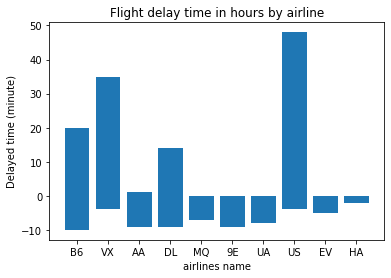

In [27]:
import matplotlib.pyplot as plt
plt.bar(flights20130504['carrier'], flights20130504['dep_delay'])
plt.xlabel('airlines name')
plt.ylabel('Delayed time (minute)')
plt.title('Flight delay time in hours by airline')
plt.show()
# Initiate the matplotplot library.
# Call out a bar graph for the selected datasets.
# Label the x-axis.
# Label the y-axis.
# Label the title of the graph.
# Call out the completed graph.

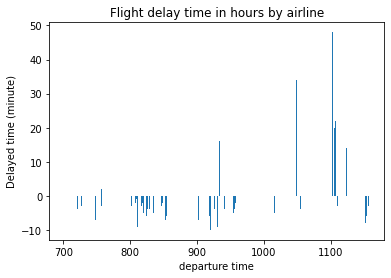

In [28]:
import matplotlib.pyplot as plt
plt.bar(flights20130504['dep_time'], flights20130504['dep_delay'])
plt.xlabel('departure time')
plt.ylabel('Delayed time (minute)')
plt.title('Flight delay time in hours by airline')
plt.show()
# Initiate the matplotplot library.
# Call out a bar graph for the selected datasets.
# Label the x-axis.
# Label the y-axis.
# Label the title of the graph.
# Call out the completed graph.

In [29]:
flights20130701 = flights2013[(flights2013.month==7) & (flights2013.day==1) & (flights2013.dep_time>1600) & (flights2013.dep_time<2300)]
pd.set_option('display.max_rows', flights20130701.shape[0]+1)
flights20130701[['year', 'month', 'day', 'dep_time', 'dep_delay']]
# Call out the data with the selected months.
# Set the max amount of rows to be shown.

,year,month,day,dep_time,dep_delay
82527,2013,7,1,1601.0,62.0
82528,2013,7,1,1602.0,363.0
82529,2013,7,1,1603.0,18.0
82530,2013,7,1,1604.0,-1.0
82531,2013,7,1,1608.0,78.0
82532,2013,7,1,1611.0,41.0
82533,2013,7,1,1612.0,103.0
82534,2013,7,1,1613.0,14.0
82535,2013,7,1,1618.0,18.0
82536,2013,7,1,1618.0,48.0


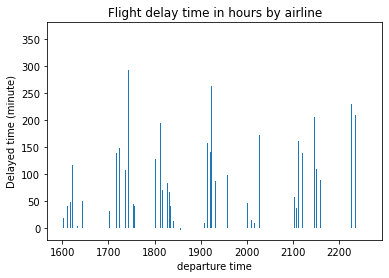

In [30]:
import matplotlib.pyplot as plt
plt.bar(flights20130701['dep_time'], flights20130701['dep_delay'])
plt.xlabel('departure time')
plt.ylabel('Delayed time (minute)')
plt.title('Flight delay time in hours by airline')
plt.show()
# Initiate the matplotplot library.
# Call out a bar graph for the selected datasets.
# Label the x-axis.
# Label the y-axis.
# Label the title of the graph.
# Call out the completed graph.

With this flights data loaded, we are presented with the departure time and departure delay time. The departure delay is in minutes, and if the numbers are below 0, then the plane has departed early. We chose these specific timeframe within the data because the departure delay time is mostly affected by the weather conditions.


In [31]:
import csv
import pandas as pd
with open('C:/Users/Hyuntae/Desktop/jfk_weather2013_2.csv', newline='') as csvfile:
    data1 = csv.reader(csvfile, delimiter = ',')
    for row in data1:
        print(', '.join(row))
# Process database/spreadsheet files (CSV).
# Process data analysis library using pandas.
# Open CSV file, return and read the file, comma used to separate fields (delimiter).
# Use for loop to iterate row in data1.

STATION, STATION_NAME, ELEVATION, LATITUDE, LONGITUDE, DATE, REPORTTPYE, HOURLYSKYCONDITIONS, HOURLYVISIBILITY, HOURLYPRSENTWEATHERTYPE, HOURLYDRYBULBTEMPF, HOURLYDRYBULBTEMPC, HOURLYWETBULBTEMPF, HOURLYWETBULBTEMPC, HOURLYDewPointTempF, HOURLYDewPointTempC, HOURLYRelativeHumidity, HOURLYWindSpeed, HOURLYWindDirection, HOURLYWindGustSpeed, HOURLYStationPressure, HOURLYPressureTendency, HOURLYPressureChange, HOURLYSeaLevelPressure, HOURLYPrecip, HOURLYAltimeterSetting, DAILYMaximumDryBulbTemp, DAILYMinimumDryBulbTemp, DAILYAverageDryBulbTemp, DAILYDeptFromNormalAverageTemp, DAILYAverageRelativeHumidity, DAILYAverageDewPointTemp, DAILYAverageWetBulbTemp, DAILYHeatingDegreeDays, DAILYCoolingDegreeDays, DAILYSunrise, DAILYSunset, DAILYWeather, DAILYPrecip, DAILYSnowfall, DAILYSnowDepth, DAILYAverageStationPressure, DAILYAverageSeaLevelPressure, DAILYAverageWindSpeed, DAILYPeakWindSpeed, PeakWindDirection, DAILYSustainedWindSpeed, DAILYSustainedWindDirection, MonthlyMaximumTemp, MonthlyMini

WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 2/25/13 3:51, FM-15, OVC:08 60, 10, , 34, 1.1, 29, -1.4, 21, -6.1, 59, 14, 330, , 30.02, 1, , 30.04, 0, 30.04, , , , , , , , , , 635, 1742, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 2/25/13 4:00, FM-12, , 9.94, , 34, 1.1, 29, -1.4, 21, -6.1, 59, 14, 330, , 30.01, 1, -0.04, 30.04, , , , , , , , , , , , 635, 1742, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 2/25/13 4:51, FM-15, SCT:04 65, 10, , 32, 0, 28, -2.1, 21, -6.1, 64, 11, 330, , 30.03, , , 30.05, 0, 30.05, , , , , , , , , , 635, 1742, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:9478

WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 4/15/13 22:51, FM-15, FEW:02 90 SCT:04 250, 10, , 44, 6.7, 41, 5.2, 38, 3.3, 79, 6, 100, , 30.37, , , 30.39, 0, 30.39, , , , , , , , , , 515, 1835, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 4/15/13 23:51, FM-15, BKN:07 85, 10, , 46, 7.8, 43, 6, 39, 3.9, 77, 8, 110, , 30.37, , , 30.39, 0, 30.39, , , , , , , , , , 515, 1835, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 4/15/13 23:59, SOD, , , , , , , , , , , , , , , , , , , , 53, 43, 48, -3.1, 54, 31, 40, 17, 0, 515, 1835, , 0, 0, 0, 30.3, 30.34, 8, 25, 70, 16, 130, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94

WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 6/10/13 11:51, FM-15, FEW:02 7 BKN:07 15 OVC:08 60, 2, +RA:02 BR:1 |RA:63 |, 64, 17.8, 63, 17.1, 62, 16.7, 93, 15, 100, 22, 30.1, , , 30.12, 0.27, 30.12, , , , , , , , , , 424, 1925, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 6/10/13 12:25, FM-16, FEW:02 7 BKN:07 47 OVC:08 140, 5, -RA:02 BR:1 |RA:61 |, 64, 18, 63, 17.4, 63, 17, 94, 18, 100, , 30.06, , , , 0.16, 30.08, , , , , , , , , , 424, 1925, , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , , -9999, -9999, , -9999, -9999, , , , , , 
WBAN:94789, JFK INTERNATIONAL AIRPORT NY US, 3.4, 40.6386, -73.7622, 6/10/13 12:51, FM-15, FEW:02 7 BKN:07 45 OVC:08 120, 6, -RA:02 BR:1 |RA:61 |, 65, 18.3, 64, 17.7, 63, 17.2, 93, 21, 110, 31, 30.05, 8, , 30.07, 0.19, 30.07, , , , , , , , , , 424, 1925, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [32]:
weather2013 = pd.read_table('C:/Users/Hyuntae/Desktop/jfk_weather2013_2.csv', sep = ',', encoding = 'iso-8859-1')
# Return a table using CSV file, separate with commas, encode Latin 1 to prevent unicode error (code point limit is 128).

C:\Users\Hyuntae\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (20,22,23,25,85,87) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [33]:
weather2013
# Intiate the data.

,STATION,STATION_NAME,ELEVATION,LATITUDE,LONGITUDE,DATE,REPORTTPYE,HOURLYSKYCONDITIONS,HOURLYVISIBILITY,HOURLYPRSENTWEATHERTYPE,...,MonthlyMaxSeaLevelPressureTime,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureDate,MonthlyMinSeaLevelPressureTime,MonthlyTotalHeatingDegreeDays,MonthlyTotalCoolingDegreeDays,MonthlyDeptFromNormalHeatingDD,MonthlyDeptFromNormalCoolingDD,MonthlyTotalSeasonToDateHeatingDD,MonthlyTotalSeasonToDateCoolingDD
0,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,1/1/13 0:51,FM-15,OVC:08 65,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
1,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,1/1/13 1:00,FM-12,NaN,9.94,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
2,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,1/1/13 1:51,FM-15,OVC:08 60,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
3,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,1/1/13 2:51,FM-15,BKN:07 46 BKN:07 80 OVC:08 250,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
4,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,1/1/13 3:51,FM-15,OVC:08 46,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13419,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,12/31/13 21:51,FM-15,SCT:04 45,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
13420,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,12/31/13 22:00,FM-12,NaN,NaN,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
13421,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,12/31/13 22:51,FM-15,CLR:00,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN
13422,WBAN:94789,JFK INTERNATIONAL AIRPORT NY US,3.4,40.6386,-73.7622,12/31/13 23:51,FM-15,CLR:00,10,NaN,...,-9999,NaN,-9999,-9999,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
weather2013[['DATE', 'HOURLYSKYCONDITIONS', 'HOURLYVISIBILITY', 'HOURLYWindSpeed']]
# Call out the data with only the selected datasets.

,DATE,HOURLYSKYCONDITIONS,HOURLYVISIBILITY,HOURLYWindSpeed
0,1/1/13 0:51,OVC:08 65,10,13.0
1,1/1/13 1:00,NaN,9.94,13.0
2,1/1/13 1:51,OVC:08 60,10,13.0
3,1/1/13 2:51,BKN:07 46 BKN:07 80 OVC:08 250,10,11.0
4,1/1/13 3:51,OVC:08 46,10,15.0
...,...,...,...,...
13419,12/31/13 21:51,SCT:04 45,10,17.0
13420,12/31/13 22:00,NaN,NaN,17.0
13421,12/31/13 22:51,CLR:00,10,17.0
13422,12/31/13 23:51,CLR:00,10,17.0


In [35]:
weather2013[['DAY','TIME']] = weather2013.DATE.str.split(expand=True)
weather2013['TIME'] = weather2013['TIME'].str.replace(':', '').astype(int)
weather20130504 = weather2013[(weather2013.DAY == "5/4/13") & (weather2013.TIME>700) & (weather2013.TIME<1200)]
pd.set_option('display.max_rows', weather20130504.shape[0]+1)
weather20130504[['DAY', 'TIME', 'HOURLYSKYCONDITIONS', 'HOURLYVISIBILITY', 'HOURLYWindSpeed']]
# Split the string using expand=True, the split elements will expand out into separate column.
# Replace the string as integer.
# Call out the specific date and time for the table.
# Set the max amount of rows to be shown.
# Call out the data with only the selected datasets.

,DAY,TIME,HOURLYSKYCONDITIONS,HOURLYVISIBILITY,HOURLYWindSpeed
4545,5/4/13,751,FEW:02 250,10,9.0
4546,5/4/13,851,CLR:00,10,9.0
4547,5/4/13,951,CLR:00,10,8.0
4548,5/4/13,1000,NaN,NaN,8.0
4549,5/4/13,1051,CLR:00,10,13.0
4550,5/4/13,1151,FEW:02 42,10,13.0


In [36]:
weather2013[['DAY','TIME']] = weather2013.DATE.str.split(expand=True)
weather2013['TIME'] = weather2013['TIME'].str.replace(':', '').astype(int)
weather20130701 = weather2013[(weather2013.DAY == "7/1/13") & (weather2013.TIME>1600) & (weather2013.TIME<2300)]
pd.set_option('display.max_rows', weather20130701.shape[0]+1)
weather20130701[['DAY', 'TIME', 'HOURLYSKYCONDITIONS', 'HOURLYVISIBILITY', 'HOURLYWindSpeed']]
# Split the string using expand=True, the split elements will expand out into separate column.
# Replace the string as integer.
# Call out the specific date and time for the table.
# Set the max amount of rows to be shown.
# Call out the data with only the selected datasets.

,DAY,TIME,HOURLYSKYCONDITIONS,HOURLYVISIBILITY,HOURLYWindSpeed
6791,7/1/13,1610,FEW:02 7 BKN:07 26 OVC:08 100,10,14.0
6792,7/1/13,1628,BKN:07 9 BKN:07 12 OVC:08 24,10,15.0
6793,7/1/13,1651,BKN:07 9 OVC:08 24,10,17.0
6794,7/1/13,1729,FEW:02 7 SCT:04 36 BKN:07 95,10,14.0
6795,7/1/13,1751,FEW:02 7 SCT:04 36 SCT:04 95,10,11.0
6796,7/1/13,1838,BKN:07 13 OVC:08 130,10,14.0
6797,7/1/13,1851,BKN:07 13 OVC:08 130,9,15.0
6798,7/1/13,1900,NaN,NaN,15.0
6799,7/1/13,1949,BKN:07 8 BKN:07 13 BKN:07 75,8,16.0
6800,7/1/13,1951,BKN:07 8 BKN:07 13 BKN:07 75,9,15.0


### Representation of Each Symbols
CLR: Clear Skies 
FEW: Few Clouds
SCT: Scattered Skies
BKN: Broken Cloudy Skies
OVC: Overcast


HourlyVisibility shows the flight visibility condition (the higher the number, the greater the visibility; maximum visibility:10)

HourlyWindSpeed shows us how the wind speed may affect the flight condition (mph)

We chose these datasets because it presents us with a speculation of flight conditions. The clouds affect the visibility of the flight, and the speed of the wind will most certainly play a factor during a flight.


### Part4 Conclusion

With these datasets (dep_delay, HOURLYSKYCONDITIONS, HOURLYVISIBILITY, and HOURLYWINDSPEED), we compared the flights with poor weather conditions (overcast clouds, low visibility, and high windspeed), and the flights with good weather conditions (clear skies, high visibility, and low windspeed). We were able to conclude how the weather conditions certainly affect the timing of the flight departure.

# Project Part5 : Data Aggregation & Data Visualization 

In [37]:
flights2013['distance'].describe()
# Generate the distance statistics.

count    111279.000000
mean       1266.249077
std         896.108376
min          94.000000
25%         427.000000
50%        1069.000000
75%        2248.000000
max        4983.000000
Name: distance, dtype: float64

1


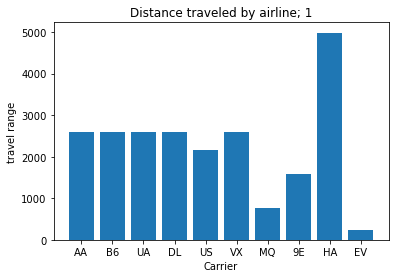

2


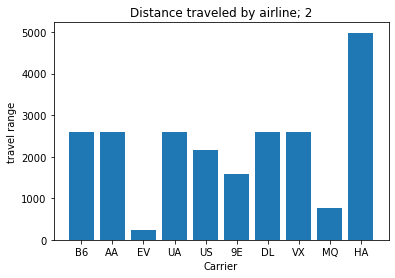

3


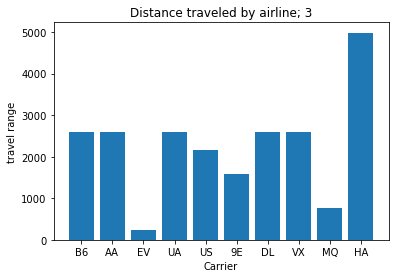

4


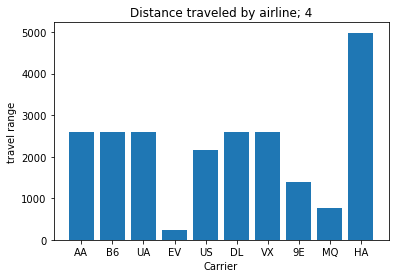

5


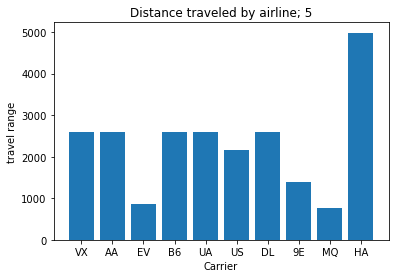

6


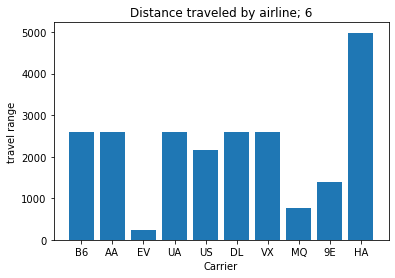

7


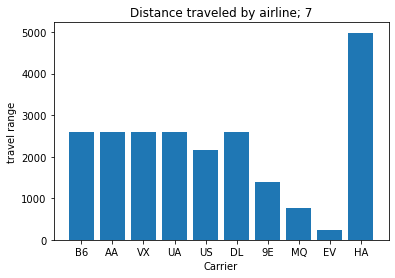

8


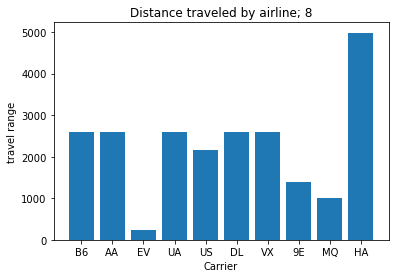

9


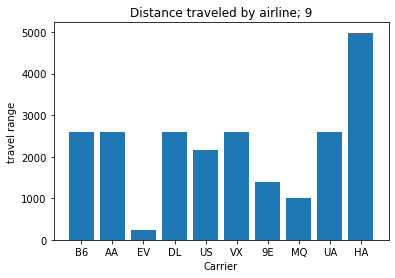

10


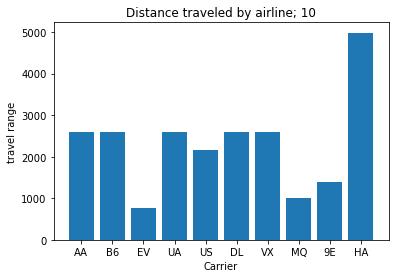

11


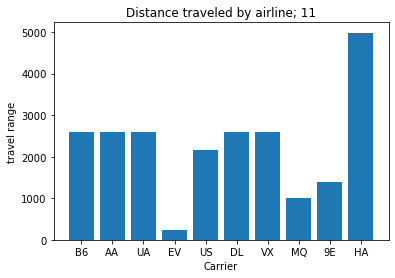

12


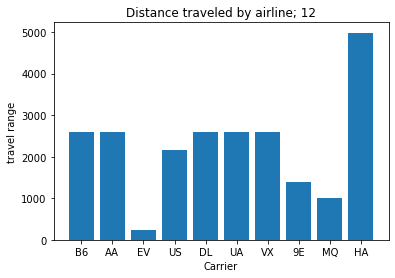

In [38]:
for month in set(flights2013.month):
    print(month)
    flights2013month = flights2013[(flights2013.month == month)]
    flights2013month[['year', 'month', 'day', 'carrier', 'distance']]
    grouped = flights2013month.groupby('carrier')
    grouped['distance'].mean()
    plt.bar(flights2013month['carrier'], flights2013month['distance'])
    plt.xlabel('Carrier')
    plt.ylabel('travel range')
    plt.title('Distance traveled by airline; '+ str(month))
    plt.show()
# Use for loop to iterate the value in months, if statement to add the result into list (year, month, day, carrier, dep_delay).
# Group the data flights2013month by carrier.
# Group it with the average of dep_delay using mean.
# Call out a bar graph for the selected datasets.
# Label the x-axis.
# Label the y-axis.
# Label the title of the graph.
# Call out the completed graph.

1


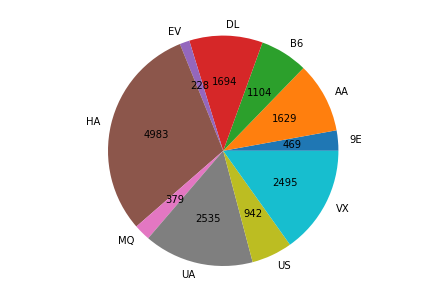

2


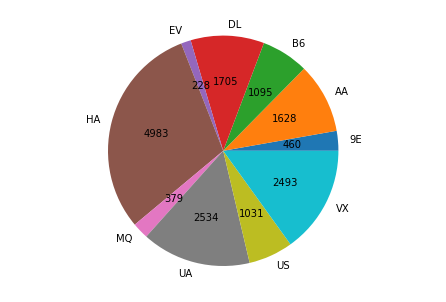

3


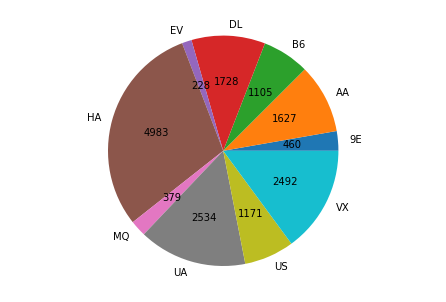

4


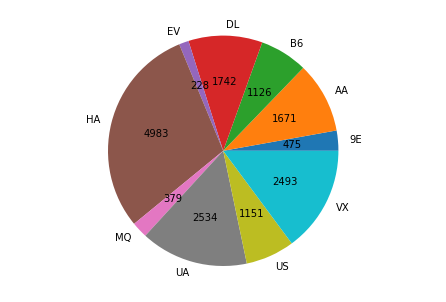

5


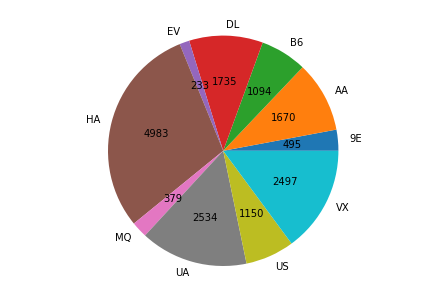

6


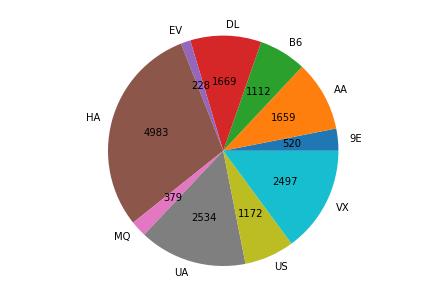

7


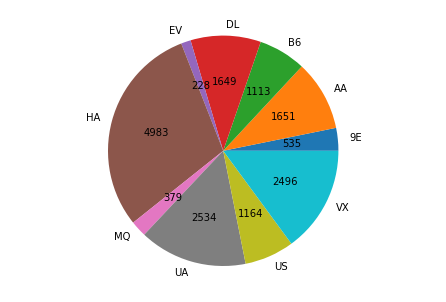

8


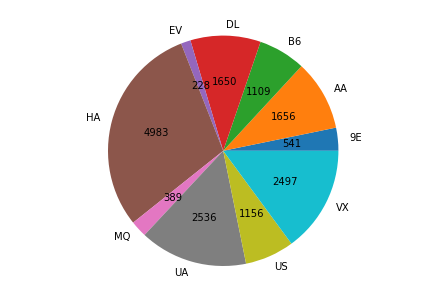

9


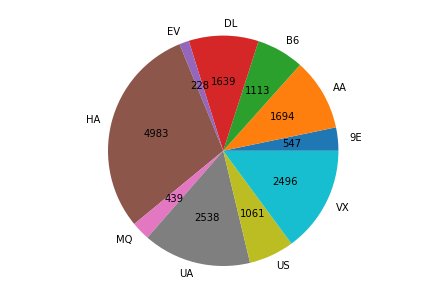

10


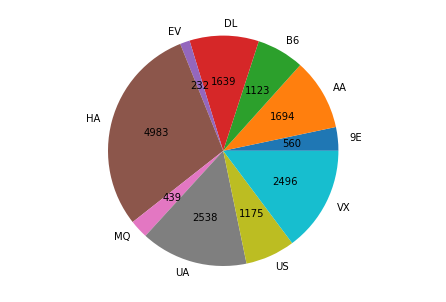

11


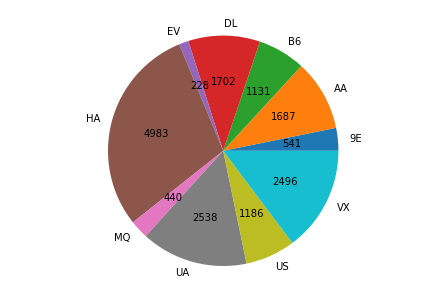

12


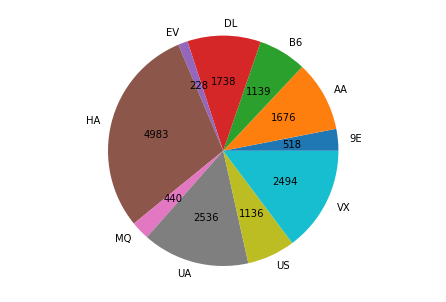

In [46]:
def autopct_format(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{v:d}'.format(v=val)
    return my_format
for month in set(flights2013.month):
    print(month)
    flights2013month = flights2013[(flights2013.month == month)]
    flights2013month[['year', 'month', 'day', 'carrier', 'distance']]
    grouped = flights2013month.groupby('carrier')
    grouped['distance'].mean()
    means = flights2013month.distance.groupby(flights2013month.carrier).mean()
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.axis('equal');
    ax.pie(means, labels=means.index, autopct=autopct_format(means));
    plt.show()
# Use the for loop to iterate values of flights2013.month.
# Group the flights.2013.month data by carrier.
# Group it with the average of distance using mean.
# Group the mean distance by month and carrier.
# Define percentage format values.
# Round the values in percentage totals divided by 100.
# Return the format value.
# Get a pie graph with the means and label with percentage format.
# Call out the completed graph.

### Airline Code Initial
AA = American Airlines
9E = Delta Connection
VX = Virgin America
US = US Airways
UA = United Airlines
MQ = American Eagles Airlines
HA = Hawaiian Airlines
EV = Express Jet
DL = Delta Airlines
B6 = Jet Blue

### Distance Graph Description

Using the graph above, we were able to analyze and find out that Hawaiian Airlines travel the longest in terms of distance. On the other hand, we found that the Express Jet Airlines travel the shortest distance amongst the group. 

In [40]:
flights2013['dep_delay'].describe()
# Generate the dep_delay statistics.

count    109416.000000
mean         12.112159
std          39.035071
min         -43.000000
25%          -5.000000
50%          -1.000000
75%          10.000000
max        1301.000000
Name: dep_delay, dtype: float64

1


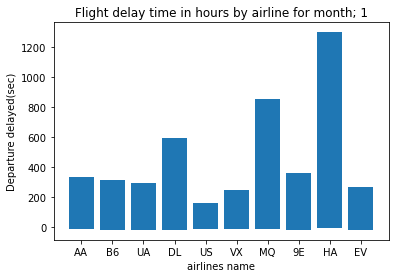

2


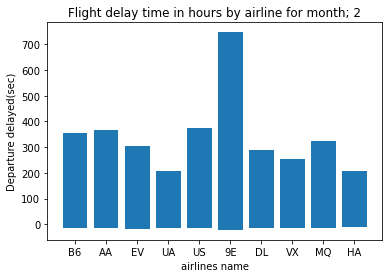

3


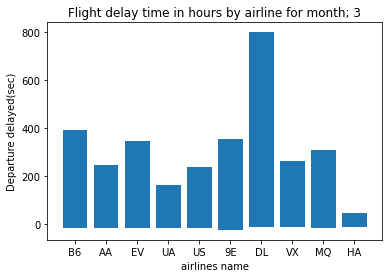

4


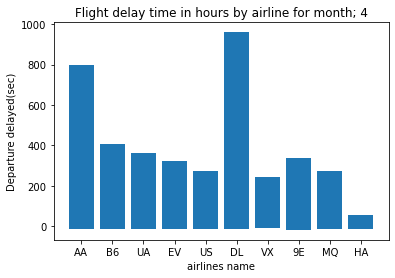

5


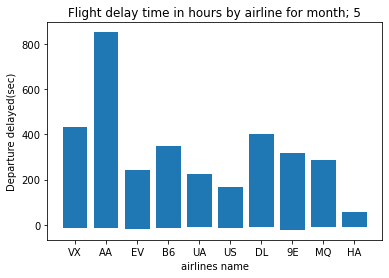

6


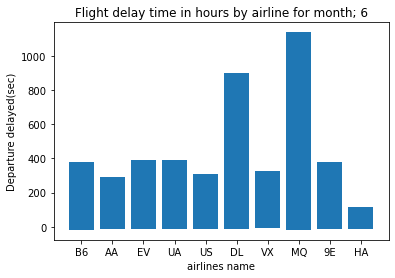

7


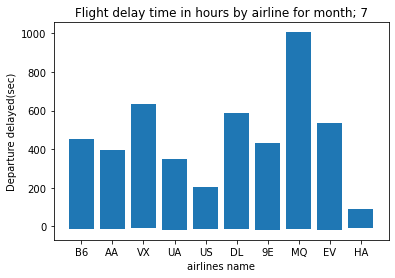

8


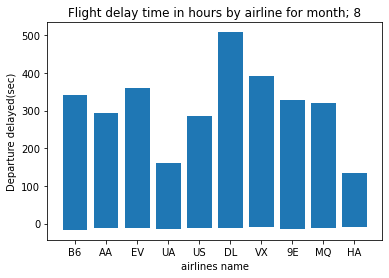

9


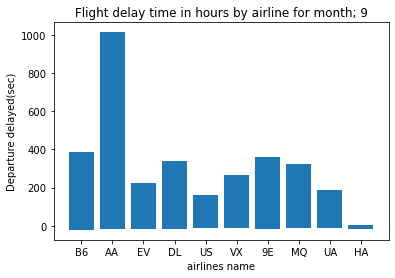

10


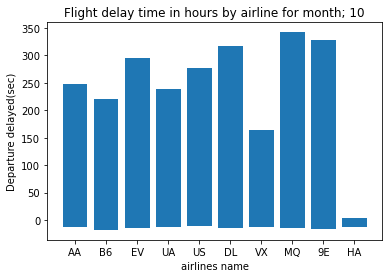

11


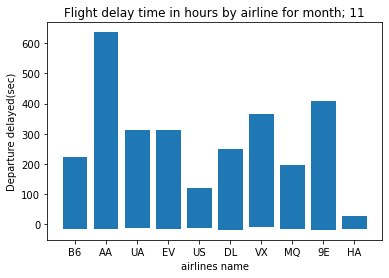

12


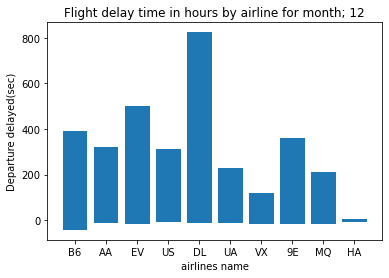

In [41]:
for month in set(flights2013.month):
    print(month)
    flights2013month = flights2013[(flights2013.month == month)]
    flights2013month[['year', 'month', 'day', 'carrier', 'dep_delay']]
    grouped = flights2013month.groupby('carrier')
    grouped['dep_delay'].mean()
    plt.bar(flights2013month['carrier'], flights2013month['dep_delay'])
    plt.xlabel('airlines name')
    plt.ylabel('Departure delayed(sec)')
    plt.title('Flight delay time in hours by airline for month; ' + str(month))
    plt.show()
# Use for loop to iterate the value in months, if statement to add the result into list (year, month, day, carrier, dep_delay).
# Group the data flights2013month by carrier.
# Group it with the average of dep_delay using mean.
# Call out a bar graph for the selected datasets.
# Label the x-axis.
# Label the y-axis.
# Label the title of the graph.
# Call out the completed graph.

1


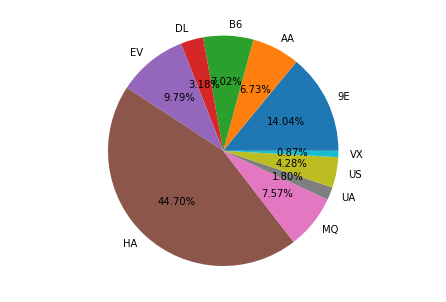

2


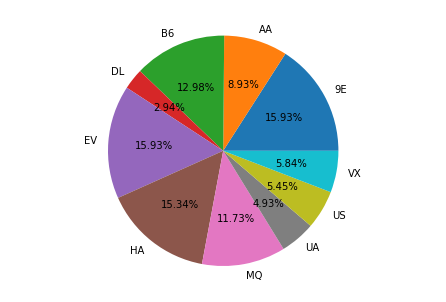

3


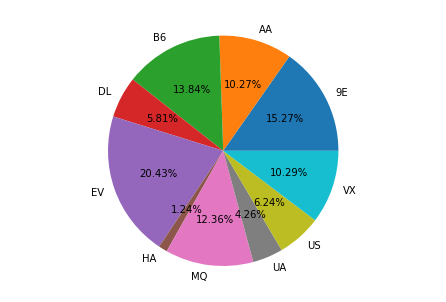

4


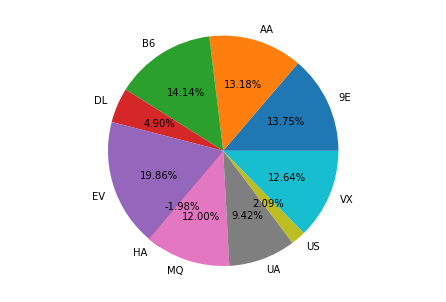

5


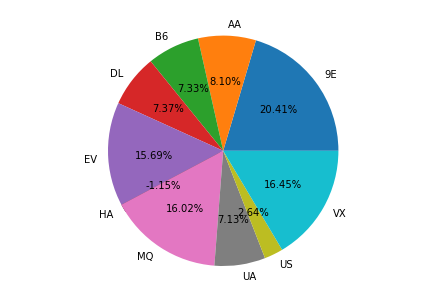

6


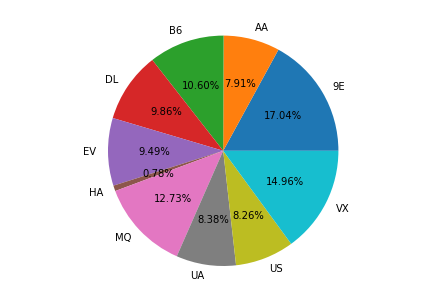

7


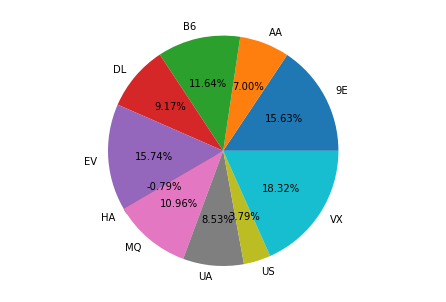

8


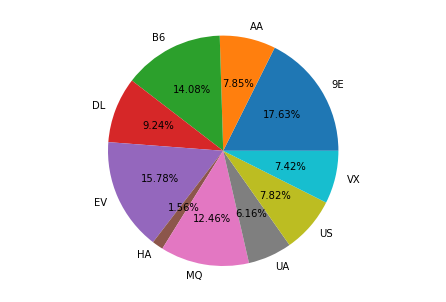

9


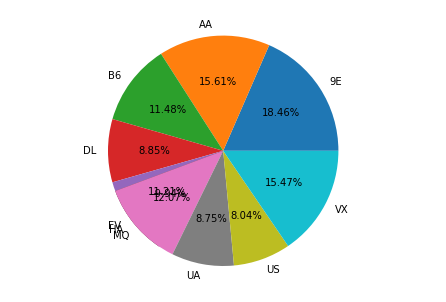

10


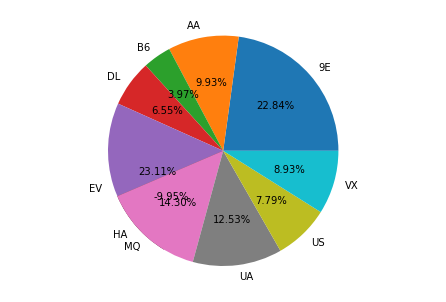

11


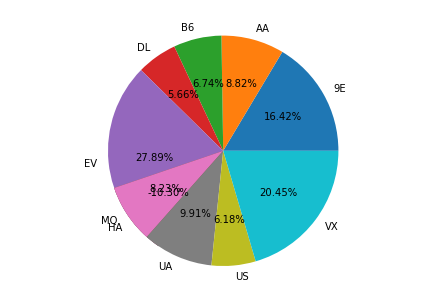

12


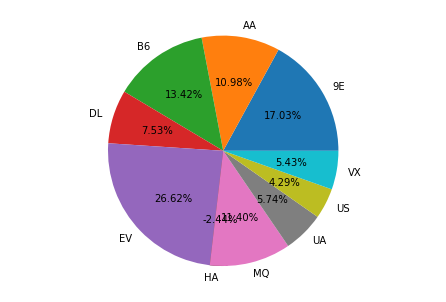

In [42]:
for month in set(flights2013.month):
    print(month)
    flights2013month = flights2013[(flights2013.month == month)]
    grouped = flights2013month.groupby('carrier')
    grouped['dep_delay'].mean()
    means = flights2013month.dep_delay.groupby(flights2013month.carrier).mean()
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.axis('equal');
    ax.pie(means, labels=means.index, autopct='%1.2f%%');
    plt.show()
# Use the for loop to iterate values of flights2013.month.
# Group the flights2013.month data by carrier
# Group it with the average of dep_delay using mean.
# Create a figure plot and add axes.
# Get a plot with the same axes from data points to plot units.
# Get a pie graph with the means and label with float format of 2 decimal places with percentage sign.
# Call out the completed graph.

### Departure Delayed Graph Description

Using the graph above, we found out that Hawaiian Airlines, which travels the longest distance amongst the airlines, had the least amount of flight delays. The airline with the most delays was American Airlines. In our perspective, we figured that the airline that travels the longest distance would also have the most flight delays. But with a full analysis of the graphs, we concluded that there is no major factor of a flight traveling a long distance that results in flight delays.

### Part5 Conclusion

For the data visualization, we presented bar graphs and pie graphs of flights by months. With the graphs, we compared the distance traveled amongst airline carriers, and we compared the departure delayed for each month by airline carrier.

# Project Conclusion

Throughout our group project, we took a step by step data analysis approach to cease an overall outlook of JFK airport and it's flights. As you may depict from our web scrapping research, we were first able to obtain the total numbers of arrivals, departures, delays, and cancellations as well as customer reviews of JFK airport. Then, we took an extra measure to use the libraries numpy and pandas to acquire the values of delayed time for each flight carriers, departure time, and arrivals time for our research. Eventually, we used a CSV file of JFK departure delayed time and weather condition data to assume the significance of how weather conditions may factor into a flight's departure time. Interestingly, the weather conditions obviously did not play a major role in delaying flight departure time. Finally, we plotted a graph of distance traveled by each flight carrier and departure delayed time by each carrier to determine whether or whether not a flight traveling a longer distance may result in a longer delay of departure.

Regarding this data research, we can claim that there are many delays in JFK airport and claim that a certain airline may presume a high delay time. As a result of our project, we may conclude that JFK airport might not be the best option for convenient travels.